In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
# from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from cmcrameri import cm
from PIL import Image

import corner

from landscapes.module_helper_functions import modules_from_txt
from landscapes.landscapes import CellDiff_Dataset_Landscape
from landscapes.landscape_visuals import visualize_all

plt.rcParams.update({'figure.dpi': 100})  # Change to 200 for high res figures
plt.rcParams.update({'font.size': 15})  


In [ ]:

def figure_from_timecode(timecode, name='landscape_1'):
    filename = data_dir + timecode + '/result_' + name + '.png'
    image = Image.open(filename)
    display(image)

In [2]:
data_dir = '../alfyn_results/saved_files/CellDiff_Dataset_Landscape/'
file_name = data_dir + 'optimization_log_100.csv'


data_dir = '../alfyn_results_new/saved_files/CellDiff_Dataset_Landscape/'
file_name = data_dir + 'optimization_log.csv'

log = pd.read_csv(file_name, sep='\t', names=['Timecode', 'Init timecode', 'Fitness'], skiprows=1)
print(log.head(5))
print(log.shape)
print(np.sum(log['Fitness']>-1.))

          Timecode    Init timecode   Fitness
0  20240712-131611  20240712-131551 -0.606590
1  20240712-132322  20240712-132300 -0.604033
2  20240712-133625  20240712-133605 -2.448996
3  20240712-134647  20240712-134626 -0.806341
4  20240712-135422  20240712-135359 -0.357256
(812, 3)
778


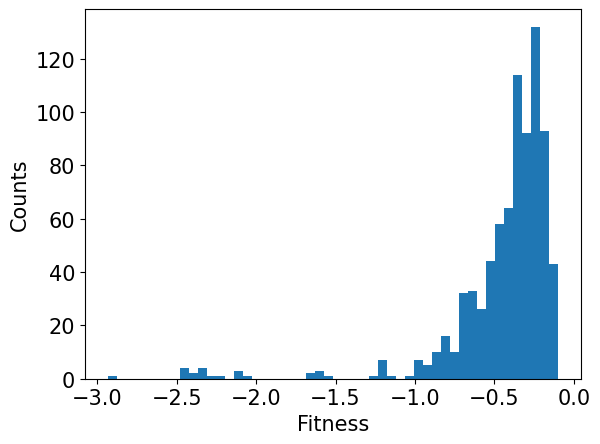

In [3]:
plt.hist(log['Fitness'], bins=50)
plt.xlabel('Fitness')
plt.ylabel('Counts')
plt.show()

0 - red, 1 - orange, 2 - yellow, 3 - green, 4 - blue 
Pairwise distances: 01, 02, 03, 04, 12, 13, 14, 23, 24, 34 
Module parameters x5 : a (x3), s (x3)
->  40 parameters 

0 1 0.5673306951283398
0 2 0.47891011882756496
0 3 0.30665135296671
0 4 0.29761750015198934
1 2 0.1289293377219303
1 3 0.6858441359750255
1 4 0.2856856010549547
2 3 0.5626962681182154
2 4 0.18225149131383633
3 4 0.41157248156821535


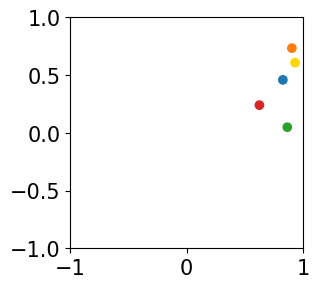

0 1 0.5673306951283398
0 2 0.478910118827565
0 3 0.30665135296671
0 4 0.2976175001519893
1 2 0.12892933772193033
1 3 0.6858441359750255
1 4 0.2856856010549548
2 3 0.5626962681182154
2 4 0.1822514913138364
3 4 0.41157248156821535


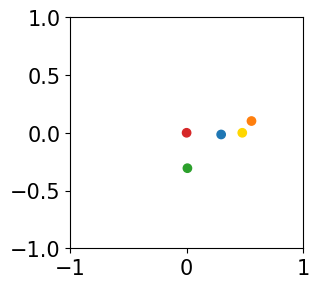

In [183]:
def transform_coords(old_coords, origin=0, direction=2, left=None, bottom=None):
    coords = old_coords - old_coords[origin]   # move origin to module 0
    d = np.linalg.norm(coords[direction])  # distance to module 1
    x, y = coords[direction, 0], coords[direction, 1]
    R = np.array([[x, y], [-y, x]])/d
    coords = (R @ coords.T).T
    if bottom is not None:
        if coords[bottom, 1] > 0:    # the last module is below 0 
            coords[:, 1] *= -1.
    if left is not None:
        if coords[left, 0] > 0:
            coords[:, 0] *= -1.
    return coords

plt.figure(figsize=(3,3))
n_points = 5
colors = ('tab:red', 'tab:orange', 'gold', 'tab:green', 'tab:blue')
coords = np.random.random((n_points, 2))
for i in range(n_points):
    for j in range(i+1, n_points):
         print(i, j, np.linalg.norm(coords[i]-coords[j]))
plt.scatter(coords[:,0], coords[:,1], c=colors)
plt.xlim((-1,1))
plt.ylim((-1,1))

plt.show()

plt.figure(figsize=(3,3))
coords = transform_coords(coords, left=0, bottom=-1)
for i in range(n_points):
    for j in range(i+1, n_points):
         print(i, j, np.linalg.norm(coords[i]-coords[j]))
plt.scatter(coords[:,0], coords[:,1], c=colors)
plt.xlim((-1,1))
plt.ylim((-1,1))
plt.show()


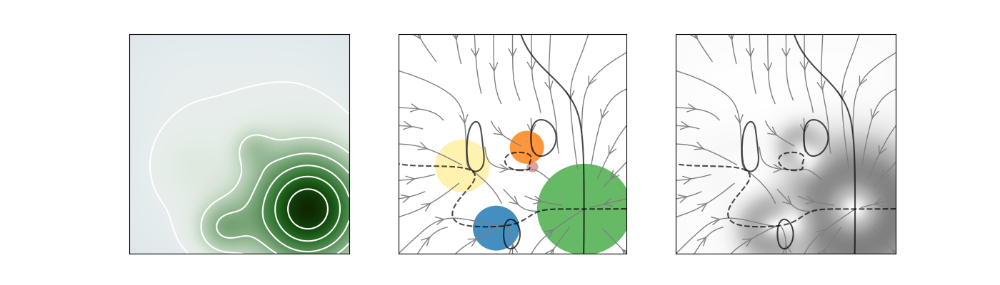

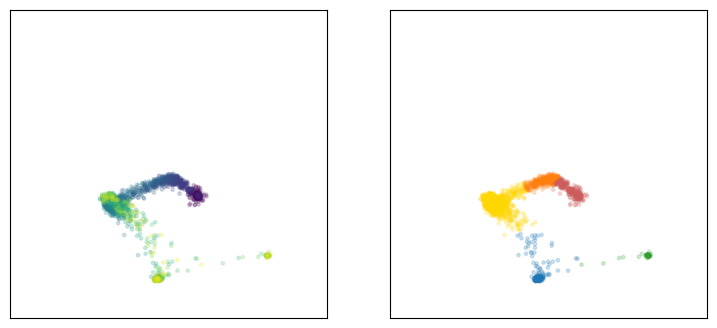

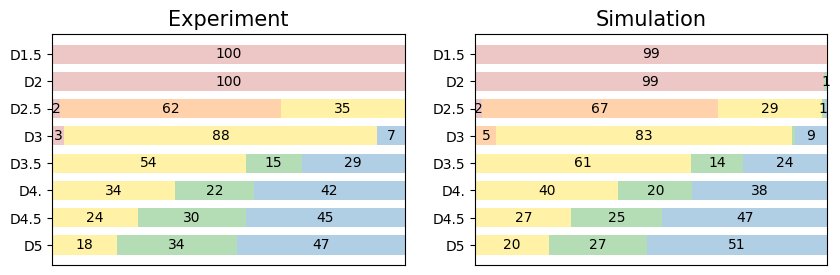

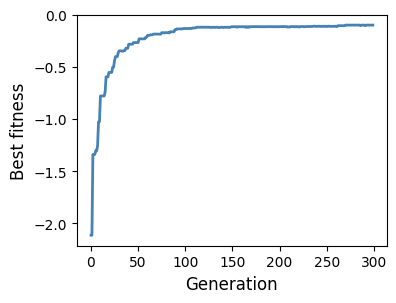

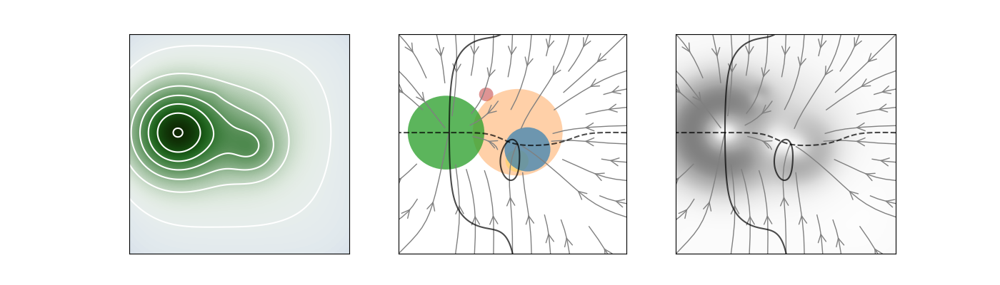

...

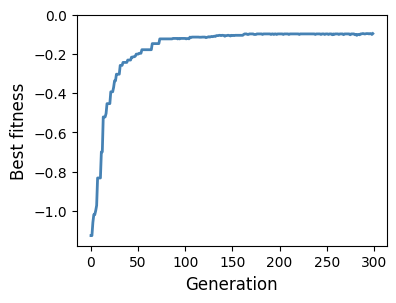

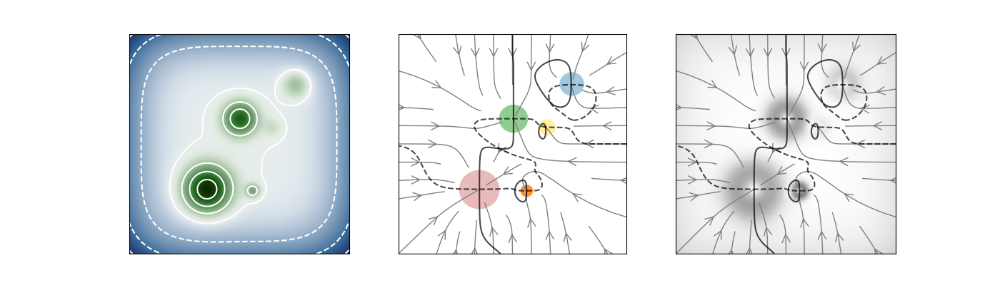

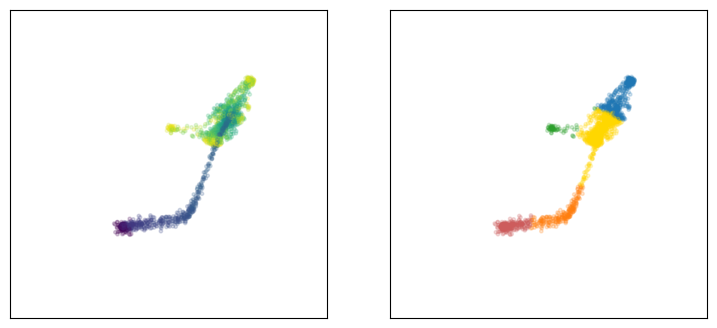

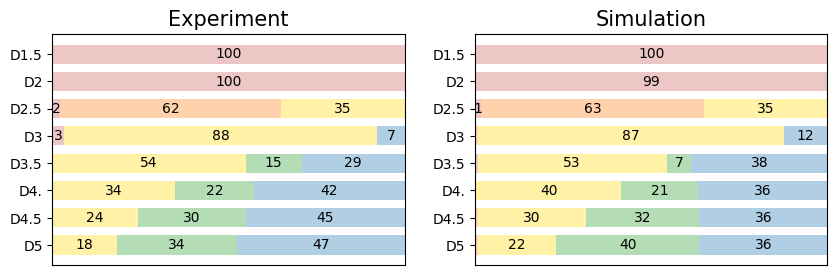

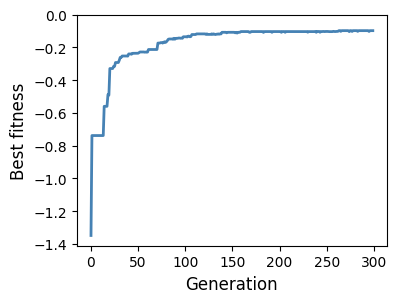

In [232]:
fitness_threshold = -0.1  #  best landscapes
gen = 299
n_landscapes = len(log['Timecode'][log['Fitness'] > fitness_threshold])
all_fitness = np.zeros((n_landscapes))
    
timecodes = log['Timecode'][log['Fitness'] > fitness_threshold]
len(timecodes)

for i in range(n_landscapes):
    timecode = timecodes.iloc[i]
    figure_from_timecode(timecode, 'landscape_2')
    figure_from_timecode(timecode, 'cell_trajectories_1')
    figure_from_timecode(timecode, 'proportions_0')
    figure_from_timecode(timecode, 'fitness_traj')
    
    

/var/folders/yn/r99j3qy962lg5cwmzc1dpqg40000gn/T/ipykernel_83868/593165740.py:7: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  all_fitness[i] = log.loc[log['Timecode']==timecode, 'Fitness']


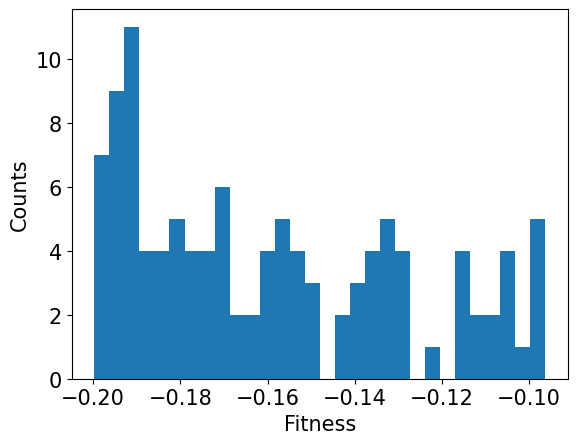

In [203]:
fitness_threshold = -0.2   #### ______________
gen = 299
n_landscapes = len(log['Timecode'][log['Fitness'] > fitness_threshold])
all_fitness = np.zeros((n_landscapes))

for i, timecode in enumerate(log['Timecode'][log['Fitness'] > fitness_threshold]):
    all_fitness[i] = log.loc[log['Timecode']==timecode, 'Fitness']
    
timecodes = log['Timecode'][log['Fitness'] > fitness_threshold]
len(timecodes)

plt.hist(all_fitness, bins=30)
plt.xlabel('Fitness')
plt.ylabel('Counts')
plt.show()

In [204]:

timecode = log['Timecode'][0]
filename = data_dir + timecode + '/' + timecode + '_module_list_' + str(gen) + '.txt'
with open(filename, 'r') as f:
    module_list = modules_from_txt(filename) 
n_modules = len(module_list)
n_pars = n_modules * (n_modules-1) // 2 + n_modules * (len(module_list[0].a) + len(module_list[0].s))

n_pars = n_modules * (n_modules-1) // 2 + n_modules * (len(module_list[0].a) -1 + len(module_list[0].s) - 1)

n_pars = (n_modules-1) * 2 - 1 + n_modules * ( len(module_list[0].a) -1 + len(module_list[0].s) - 1)

# n_pars = (n_modules-1) * 2 - 1 + n_modules * ( len(module_list[0].a) -1 )


# n_pars = n_modules * (n_modules-1) // 2   ###########

print(n_landscapes, n_pars)

all_pars = np.zeros((n_landscapes, n_pars))   

        
    
def pars_from_timecode(timecode, data_dir, gen):
    par_names = []
    filename = data_dir + timecode + '/' + timecode + '_module_list_' + str(gen) + '.txt'
    with open(filename, 'r') as f:
        module_list = modules_from_txt(filename)
    # module_list = module_list[:2]
    
    n_modules = len(module_list)
    # n_pars = n_modules * (n_modules-1) // 2 + n_modules * (len(module_list[0].a) + len(module_list[0].s))
    # print(n_pars)
    # all_pars = np.zeros(n_pars)
    
    coords = np.zeros((n_modules, 2))
    for i, module in enumerate(module_list):
        # print(module)
        coords[i] = module.x, module.y
    pars = []
    
    
    origin = 2
    direction = 0
    coords = transform_coords(coords, origin=origin, direction=direction, left=0, bottom=4)     ###
    for i in range(0, n_modules):
        if i == origin: # x=0, y=0
            continue
        par_names.append('x '+str(i))
        pars.append(coords[i,0])
        if i == direction:  # y = 0
            continue
        par_names.append('y '+str(i))
        pars.append(coords[i,1])
    
    # for i in range(n_modules):
    #     for j in range(i+1, n_modules):
    #         par_names.append('Dist '+str(i)+str(j))
    #         pars.append(np.linalg.norm(coords[i]-coords[j]))
    #      # print(i, j, np.linalg.norm(coords[i]-coords[j]))
    # 
    for i, module in enumerate(module_list):
        pars.extend(module.a[1:])
        for j in range(1, len(module.a)):
            par_names.append('M'+str(i)+' a'+ str(j))
            
    for i, module in enumerate(module_list):
        pars.extend(module.s[1:])
        for j in range(1, len(module.s)):
            par_names.append('M'+str(i)+' s'+ str(j))
    
    return np.array(pars), par_names


111 27


In [205]:
def landscape_from_timecode(timecode, data_dir, gen, landscape_pars):
    filename = data_dir + timecode + '/' + timecode + '_module_list_' + str(gen) + '.txt'
    with open(filename, 'r') as f:
        module_list = modules_from_txt(filename)
    landscape = CellDiff_Dataset_Landscape(module_list, A0=landscape_pars['A0'])
    return landscape

landscape_pars = {
    'A0': 0.005,
}


    # image.show()
    

In [206]:
# pars_from_timecode(log['Timecode'][0], data_dir, 299)

for i, timecode in enumerate(log['Timecode'][log['Fitness'] > fitness_threshold]):
    all_pars[i, :], par_names = pars_from_timecode(timecode, data_dir, gen)
    

In [207]:
print(par_names)

['x 0', 'x 1', 'y 1', 'x 3', 'y 3', 'x 4', 'y 4', 'M0 a1', 'M0 a2', 'M1 a1', 'M1 a2', 'M2 a1', 'M2 a2', 'M3 a1', 'M3 a2', 'M4 a1', 'M4 a2', 'M0 s1', 'M0 s2', 'M1 s1', 'M1 s2', 'M2 s1', 'M2 s2', 'M3 s1', 'M3 s2', 'M4 s1', 'M4 s2']


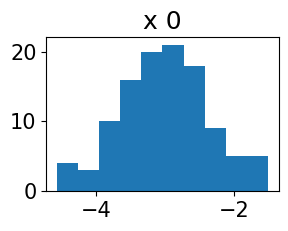

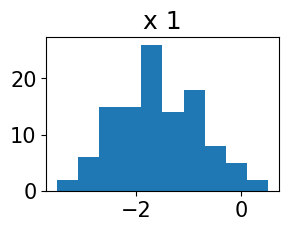

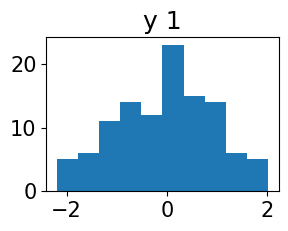

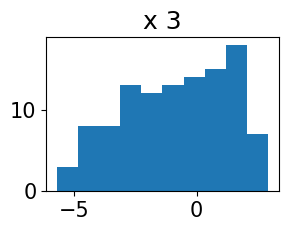

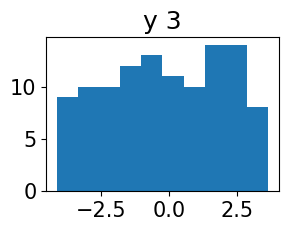

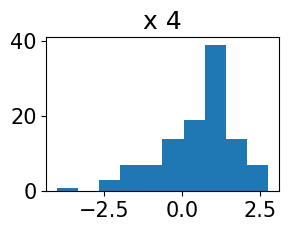

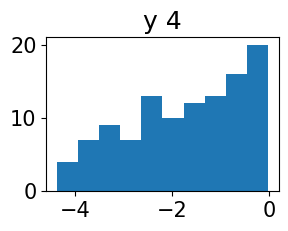

In [208]:
# all_pars

# for j in range(10):
for j in range(7):
    plt.figure(figsize=(3,2))
    plt.hist(all_pars[:, j], bins=10)
    plt.title(par_names[j])
    # plt.xlim([0, 10])

    # plt.xlim((-3,3))
    plt.show()

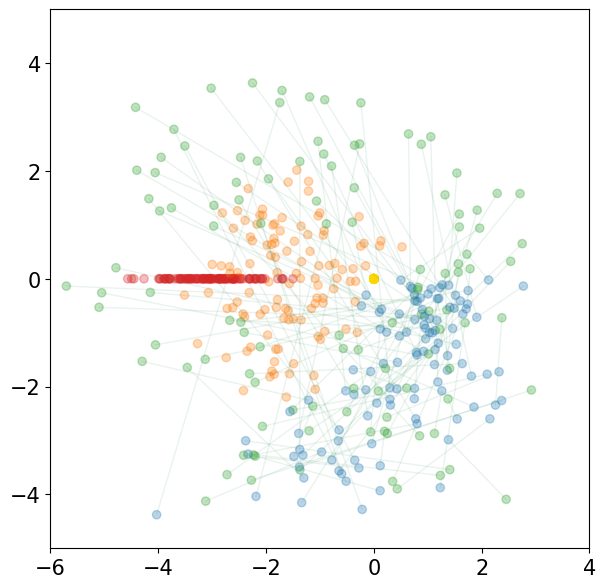

In [209]:
colors = ('tab:red', 'tab:orange', 'gold', 'tab:green', 'tab:blue')

fig, ax = plt.subplots(figsize=(7,7))
for i in range(n_landscapes):
    coords = np.zeros((5, 2))
    coords[0, 0] = all_pars[i, 0]
    coords[1, :] = all_pars[i, 1:3]
    coords[3, :] = all_pars[i, 3:5]
    coords[4, :] = all_pars[i, 5:7]
    # coords[:, 0] *= -1
    # coords[:, 0] += (coords[0, 0] + coords[2,0])/2
    
    # coords[1, :] = all_pars[i, :2]
    # coords[2, 0] = all_pars[i, 2]
    # coords[3, :] = all_pars[i, 3:5]
    # coords[4, :] = all_pars[i, 5:7]
    # coords /= coords[2, 0]

    plt.scatter(coords[:, 0], coords[:, 1], c=colors, alpha=0.3, edgecolors=None)
    plt.plot(coords[-2:, 0], coords[-2:, 1], linewidth=1, alpha=0.1, c='seagreen')
plt.ylim((-5,5))
plt.xlim((-4,6))
plt.xlim((-6, 4))
# plt.ylim((-3,3))
# plt.xlim((-3,3))
ax.set_aspect('equal')
plt.show()

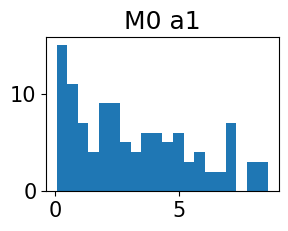

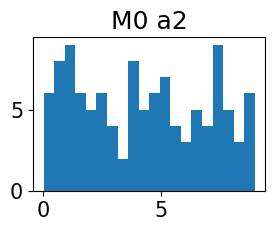

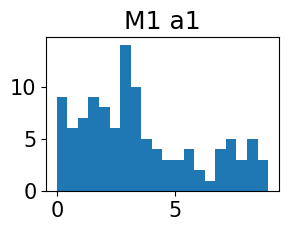

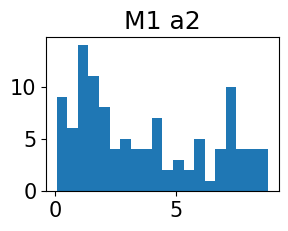

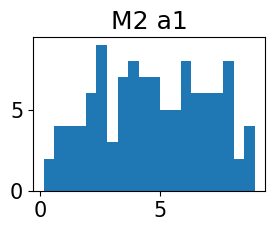

...

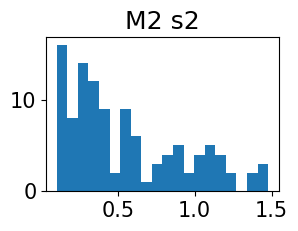

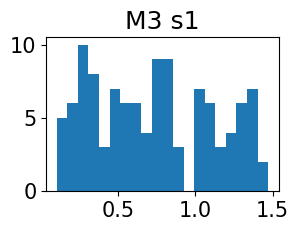

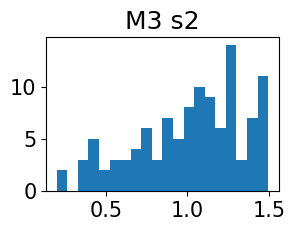

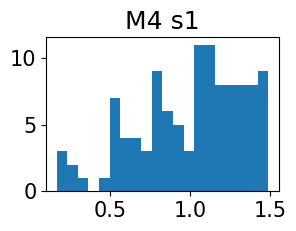

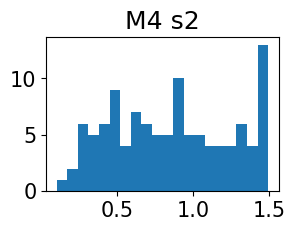

In [210]:
for j in range(7, n_pars):
    plt.figure(figsize=(3,2))
    plt.hist(all_pars[:, j], bins=20)
    plt.title(par_names[j])
    # plt.xlim((-3,3))
    
    # plt.xlim([0, 10])
    plt.show()

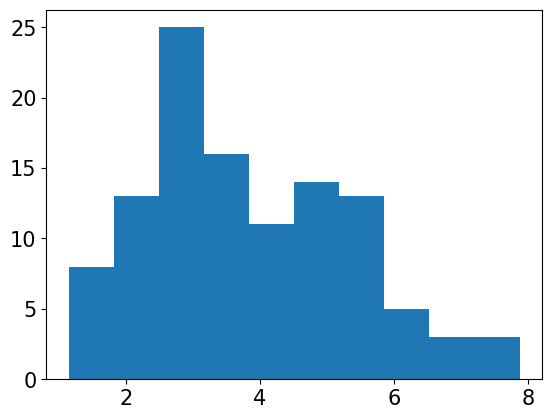

In [211]:
plt.hist(np.linalg.norm((all_pars[:, [3,5]] - all_pars[:, [4,6]]), axis = 1))
plt.show()

(111, 27)


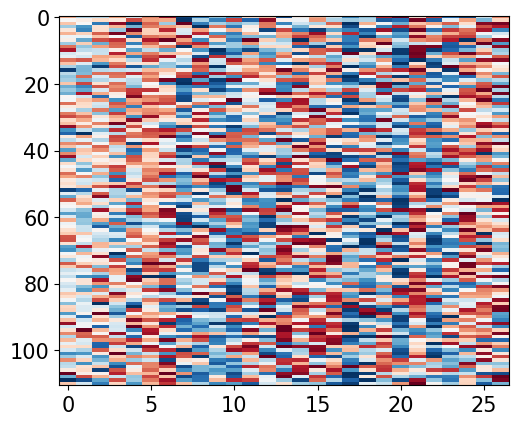

In [212]:
# scaler = StandardScaler()
scaler = MinMaxScaler()
# scaler = RobustScaler()
scaler.fit(all_pars)
# print(scaler.mean_)
scaled_pars = scaler.transform(all_pars)
print(all_pars.shape)

plt.imshow(scaled_pars, interpolation=None, cmap='RdBu_r', aspect=0.2)
plt.show()


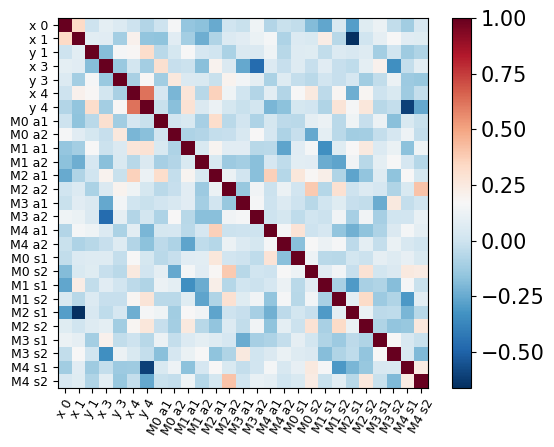

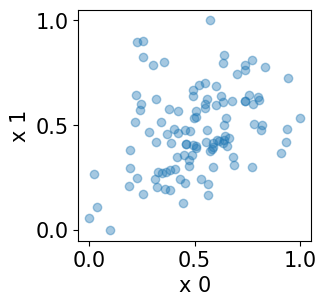

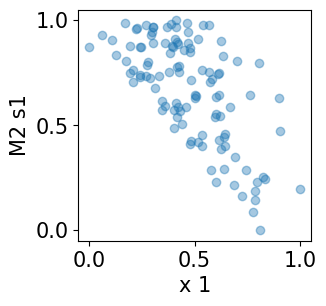

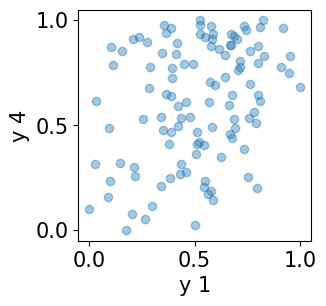

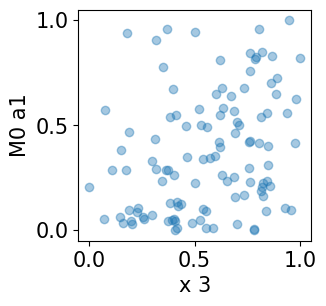

...

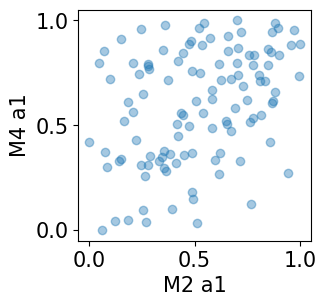

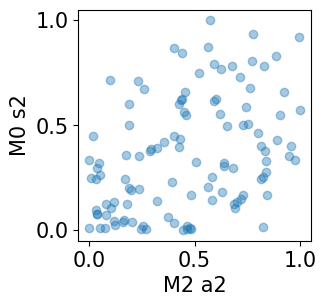

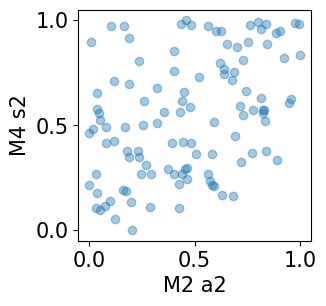

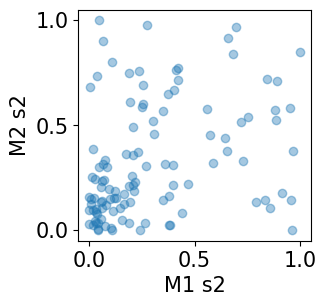

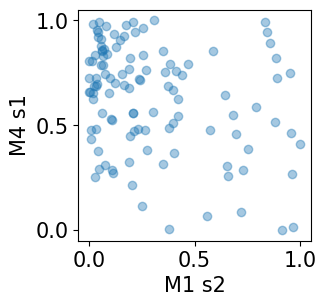

In [213]:

cov = np.corrcoef(all_pars, rowvar=False)
plt.imshow(cov, interpolation=None, cmap='RdBu_r')
ax = plt.gca()
plt.xticks(ticks=range(n_pars), labels=par_names, size=9, rotation=60)
plt.yticks(ticks=range(n_pars), labels=par_names, size=9)
plt.colorbar()
plt.show()


def corr_plot(par_i, par_j, pars):
    plt.figure(figsize=(3,3))
    plt.scatter(pars[:, par_i], scaled_pars[:, par_j], alpha=0.4)
    plt.xlabel(par_names[par_i])
    plt.ylabel(par_names[par_j])
    plt.yticks((0., 0.5, 1.))
    plt.xticks((0., 0.5, 1.))
    plt.show()


idx = np.where(np.abs(cov) > 0.3)
for i in range(len(idx[0])):
    if idx[0][i] < idx[1][i]:
        corr_plot(idx[0][i], idx[1][i], scaled_pars)
    

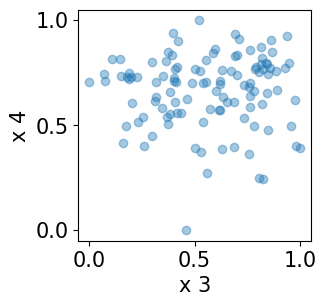

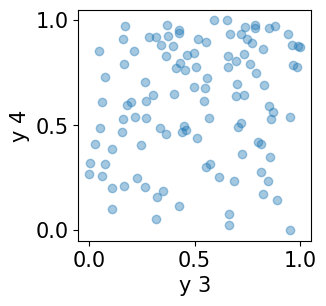

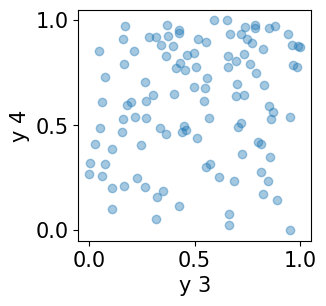

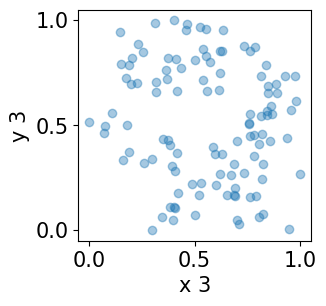

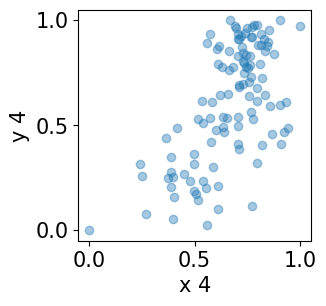

In [214]:
corr_plot(3, 5, scaled_pars)
corr_plot(4, 6, scaled_pars)
corr_plot(4, 6, scaled_pars)
corr_plot(3, 4, scaled_pars)
corr_plot(5, 6, scaled_pars)

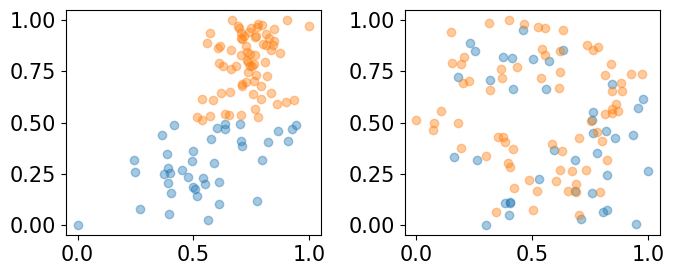

In [215]:
fig, ax = plt.subplots(1, 2, figsize=(7,3))
idx = scaled_pars[:, 6] < 0.5
ax[0].scatter(scaled_pars[idx, 5], scaled_pars[idx, 6], alpha=0.4)
ax[1].scatter(scaled_pars[idx, 3], scaled_pars[idx, 4], alpha=0.4)
idx = scaled_pars[:, 6] >= 0.5
ax[0].scatter(scaled_pars[idx, 5], scaled_pars[idx, 6], alpha=0.4)
ax[1].scatter(scaled_pars[idx, 3], scaled_pars[idx, 4], alpha=0.4)
plt.tight_layout()
plt.show()

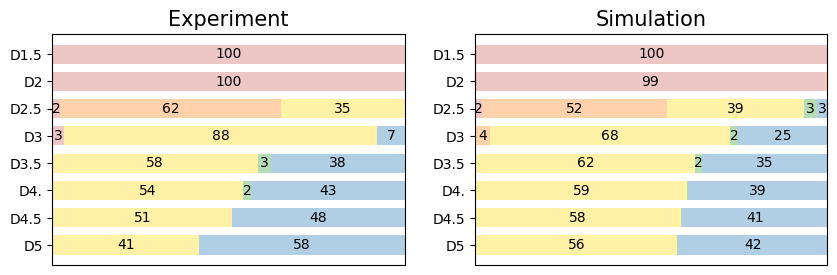

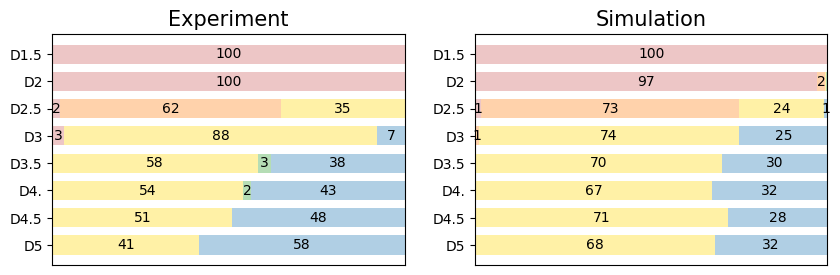

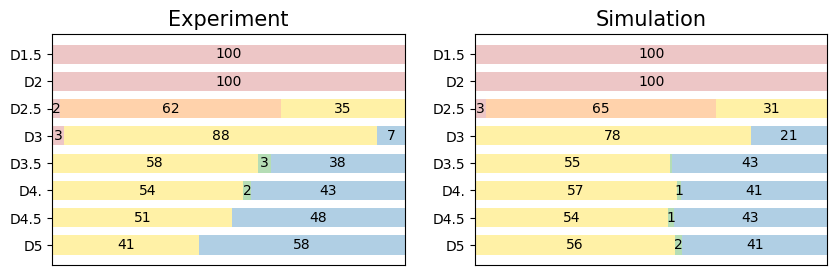

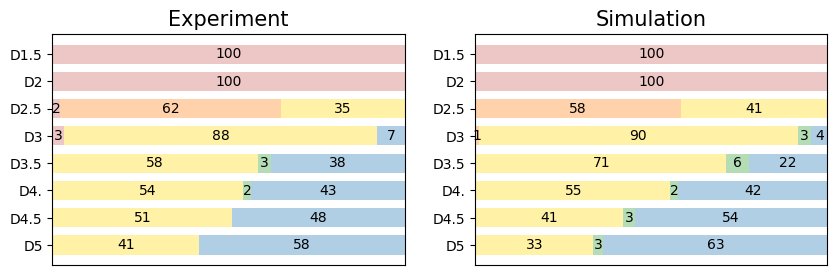

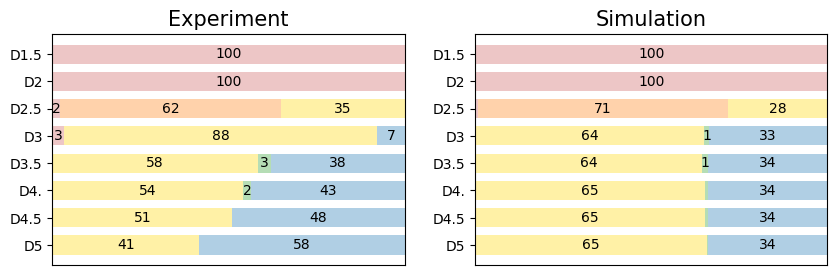

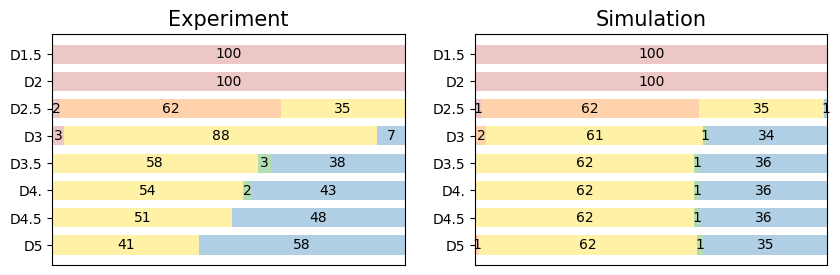

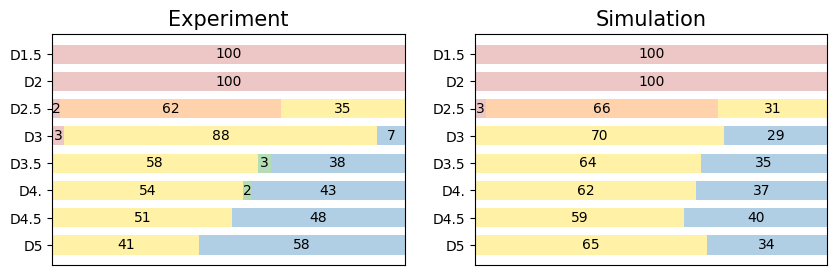

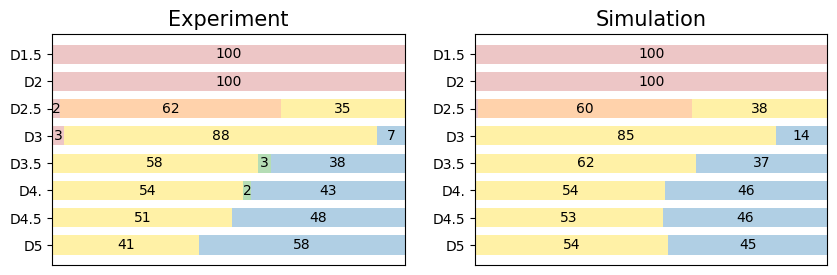

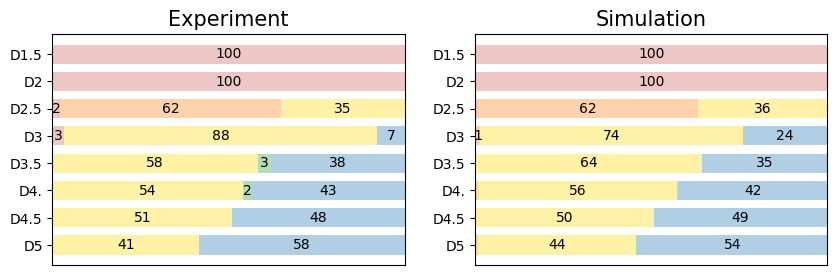

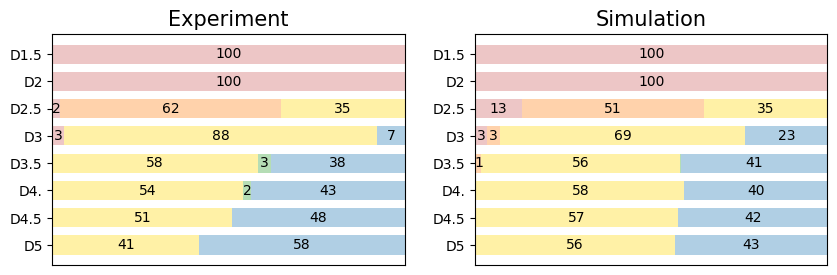

In [220]:
for i in range(10, 20):
    timecode = timecodes.iloc[i]
    figure_from_timecode(timecode, 'proportions_2')
    

[0.10445502 0.09313395 0.08982014 0.07244303 0.06827734 0.06045723
 0.0545927  0.05213369 0.04730873 0.04261618 0.03792381 0.03598913
 0.03383895 0.02906956 0.02811999 0.02589057 0.02224755 0.01940543
 0.01633347 0.013938   0.01345447 0.01027508 0.00892958 0.00727746
 0.0062697  0.00366709 0.00213215]


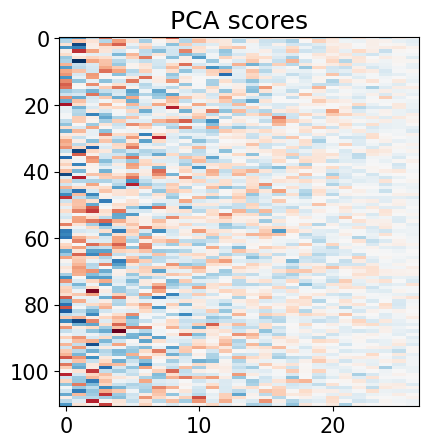

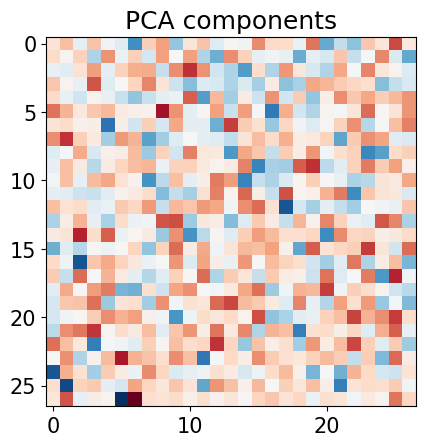

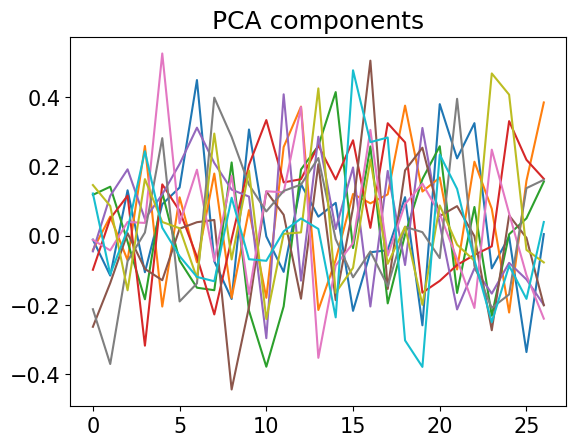

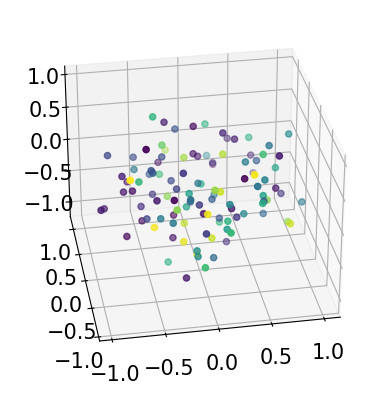

In [173]:
pca = PCA(n_components=None)
pca.fit(scaled_pars)
X = pca.transform(scaled_pars)

print(pca.explained_variance_ratio_)

plt.imshow(X, interpolation=None, cmap='RdBu', aspect=0.25)
plt.title('PCA scores')
plt.show()
plt.imshow(pca.components_, interpolation=None, cmap='RdBu')
plt.title('PCA components')
plt.show()

for component in range(10):
    plt.plot(pca.components_[component])
plt.title('PCA components')
plt.show()
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d", elev=30, azim=-100)

ax.scatter(X[:, 0], X[:, 1], X[:, 2], c = all_fitness)
plt.show()




2 clusters
-0.15895447939970314 0.029206821971425795
-0.15960290678091882 0.03255972094315092


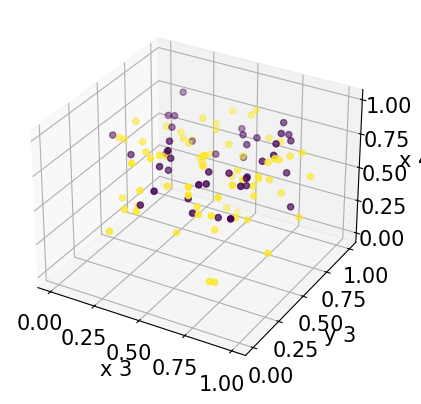

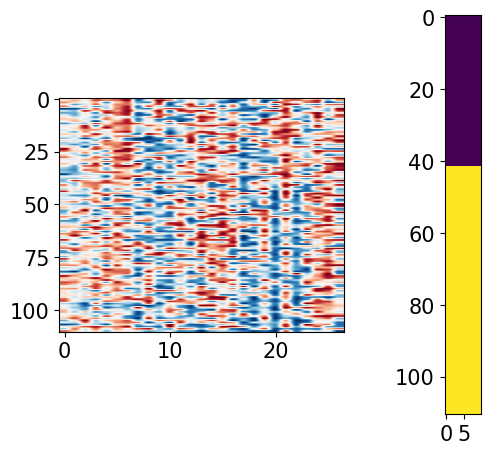

3 clusters
-0.1619446302671974 0.03211248568980615
-0.15402077005987794 0.030204664235782323
-0.162587727064182 0.0309180531502459


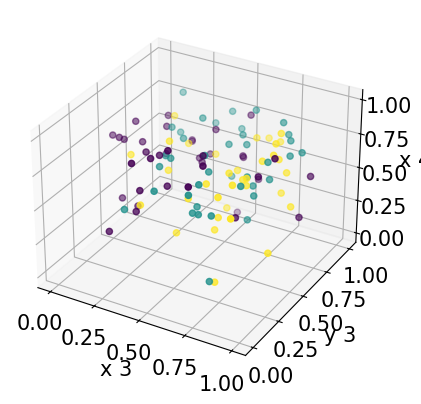

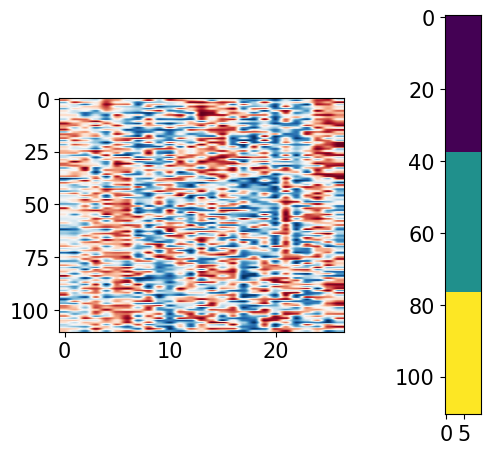

4 clusters
-0.16255845000069127 0.03020780433155013
-0.16772860839039322 0.027990257017286073
-0.15275604356306935 0.028980700509946514
-0.156421528815238 0.03643794665415231


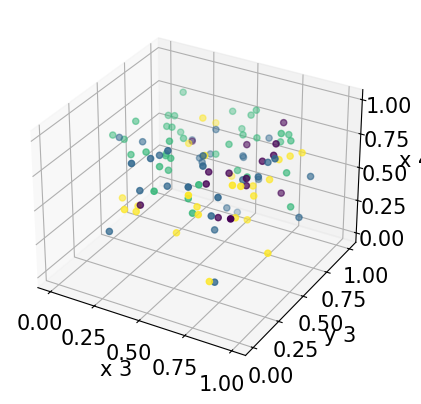

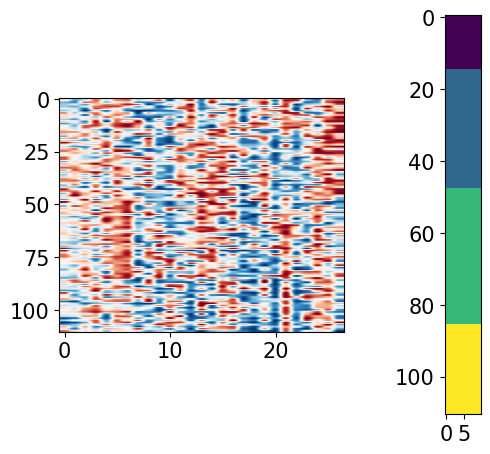

5 clusters
-0.14738866699200676 0.028872483750411793
-0.16069291289726326 0.03293777472015637
-0.15917068341462448 0.03346185670627388
-0.1590941965179939 0.027509249956007596
-0.16498287584563776 0.03025876822971748


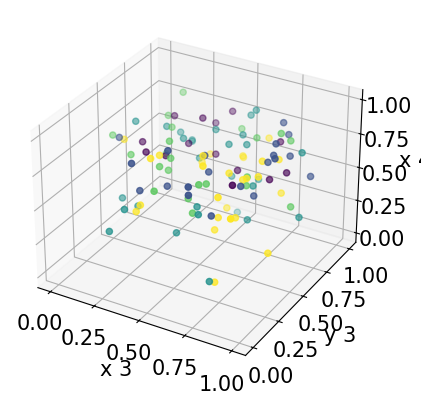

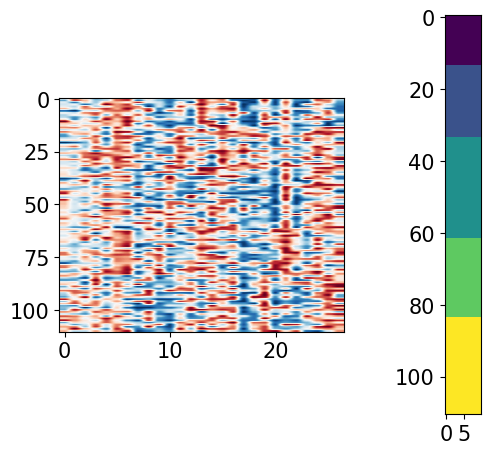

6 clusters
-0.17388322229890896 0.010449862685709077
-0.1546957553781835 0.030388356206815893
-0.1572318378165333 0.03731079442958115
-0.14962740098020433 0.03320452966368692
-0.15767338116911334 0.027761856486018276
-0.17543107386071774 0.023417515159129595


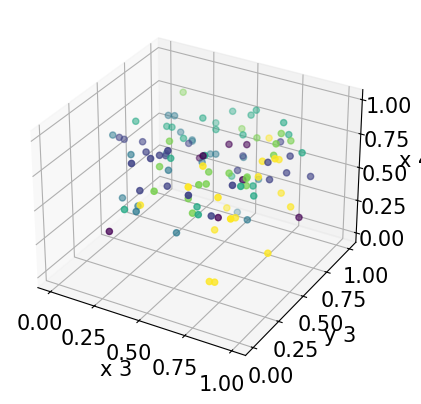

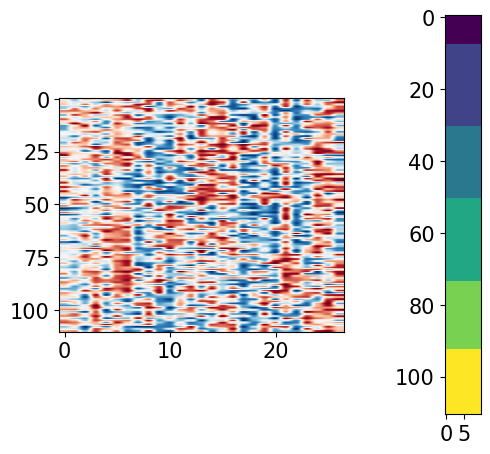

In [174]:
for n_clusters in np.arange(2,7):
    estimator = KMeans(n_clusters=n_clusters)
    X = scaled_pars
    estimator.fit(X)
    labels = estimator.labels_
    
    # print(np.labels)
    print(n_clusters, 'clusters')
    for label in np.unique(labels):
        label_fitness = all_fitness[labels == label]
        print(np.mean(label_fitness), np.std(label_fitness))
    
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d", azim=-60, elev=30)
    # ax.scatter(X[:, 1], X[:, 3], X[:, 9], c=labels.astype(float), edgecolor=None)
    ax.scatter(X[:, 3], X[:, 4], X[:, 5], c=labels.astype(float), edgecolor=None)
    
    ax.set_xlabel(par_names[1])
    ax.set_ylabel(par_names[3])
    ax.set_zlabel(par_names[9])
    
    ax.set_xlabel(par_names[3])
    ax.set_ylabel(par_names[4])
    ax.set_zlabel(par_names[5])
    
    plt.show()
    fig, ax = plt.subplots(1,2)
    ax[0].imshow(X[np.argsort(labels), :], interpolation=None, cmap='RdBu_r', aspect=0.2)
    ax[1].imshow(np.tile( np.sort(labels), (10,1)).T)
    fig.tight_layout()
    plt.show()

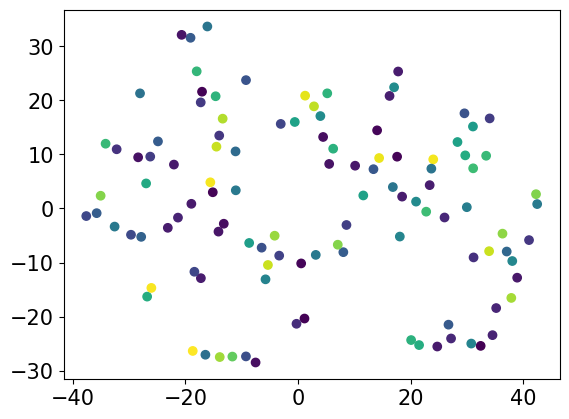

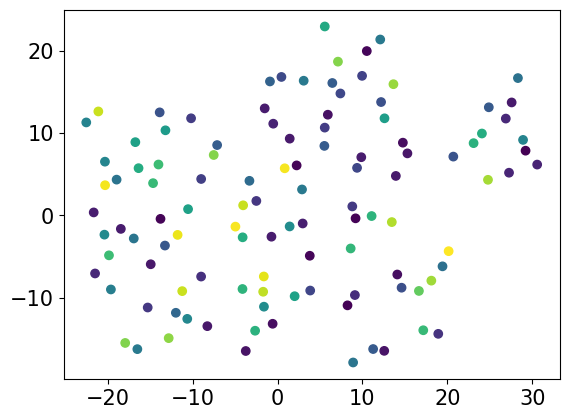

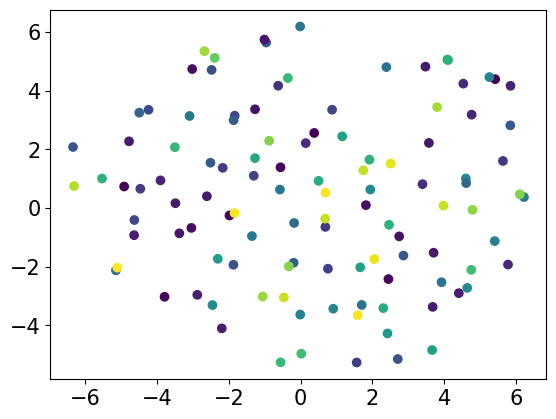

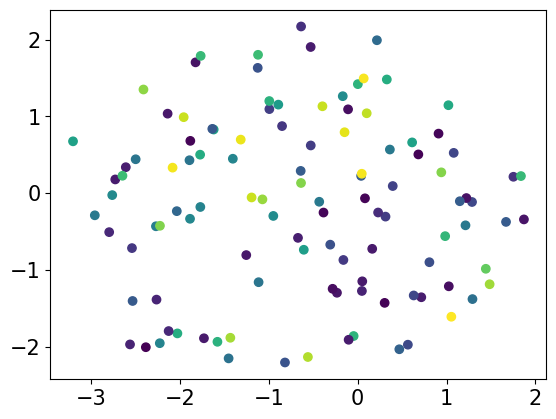

In [176]:
n_components = 2
for perplexity in (5, 10, 30, 50):
    tsne = TSNE(n_components=n_components,init="random",random_state=0,perplexity=perplexity,max_iter=1000)
    X = scaled_pars.copy()
    Y = tsne.fit_transform(X)
    plt.scatter(Y[:, 0], Y[:, 1], c = all_fitness)
    plt.show()

In [243]:
print(par_names[:10])
print(par_names[10:20])
print(par_names[20:])


['Dist 01', 'Dist 02', 'Dist 03', 'Dist 04', 'Dist 12', 'Dist 13', 'Dist 14', 'Dist 23', 'Dist 24', 'Dist 34']
['Module 0 a1', 'Module 0 a2', 'Module 1 a1', 'Module 1 a2', 'Module 2 a1', 'Module 2 a2', 'Module 3 a1', 'Module 3 a2', 'Module 4 a1', 'Module 4 a2']
['Module 0 s1', 'Module 0 s2', 'Module 1 s1', 'Module 1 s2', 'Module 2 s1', 'Module 2 s2', 'Module 3 s1', 'Module 3 s2', 'Module 4 s1', 'Module 4 s2']


2 components
Score: 7.664825732747945
0 fitness: -0.2192318341009584 0.05323376694969594
1 fitness: -0.21053882579338382 0.04297004678781832
Cluster 0


/Users/victoria/Library/Caches/pypoetry/virtualenvs/landscapes-O0yv0U85-py3.11/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/victoria/Library/Caches/pypoetry/virtualenvs/landscapes-O0yv0U85-py3.11/lib/python3.11/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


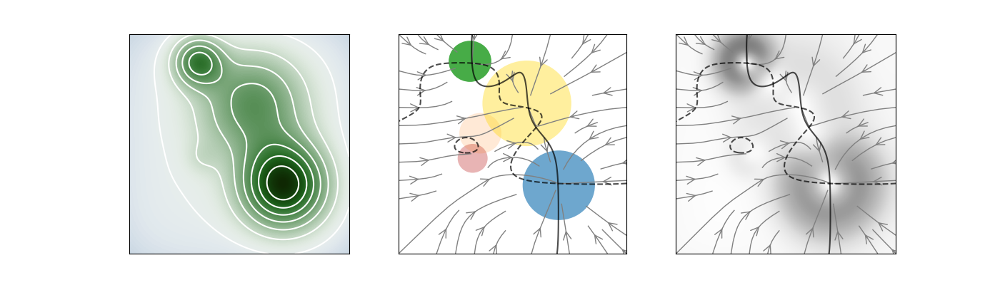

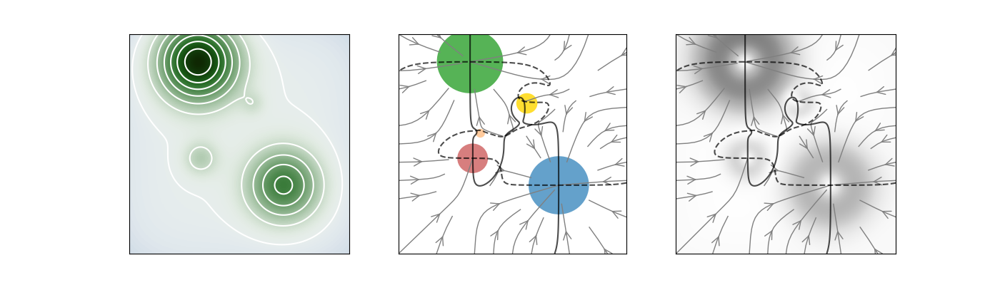

Cluster 1


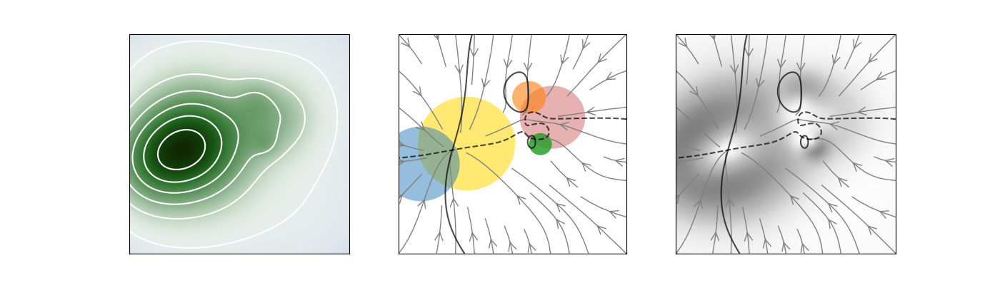

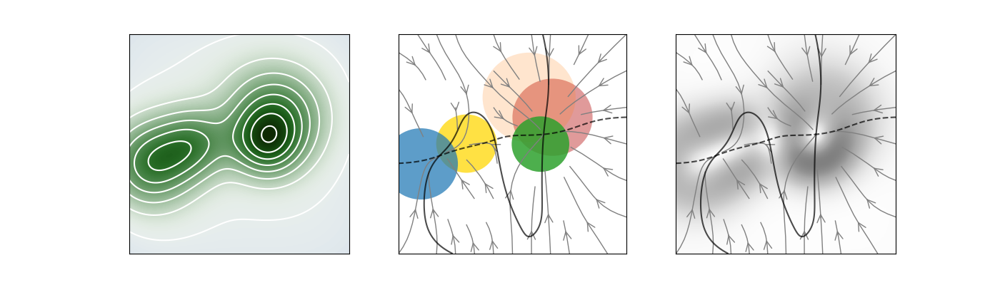

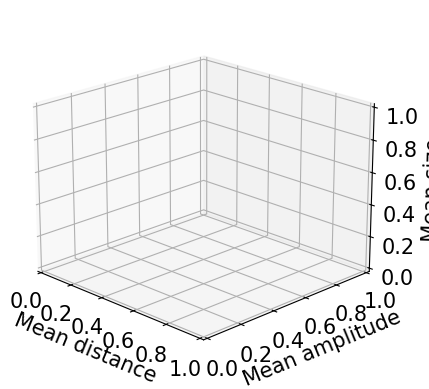

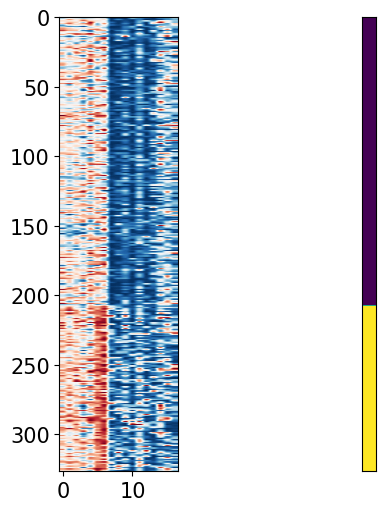

3 components
Score: 8.240893344372843
0 fitness: -0.23232810791315414 0.0466361189644285
1 fitness: -0.208733845295239 0.046181716899263044
2 fitness: -0.19527070220097298 0.04872989120836775
Cluster 0


/Users/victoria/Library/Caches/pypoetry/virtualenvs/landscapes-O0yv0U85-py3.11/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/victoria/Library/Caches/pypoetry/virtualenvs/landscapes-O0yv0U85-py3.11/lib/python3.11/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


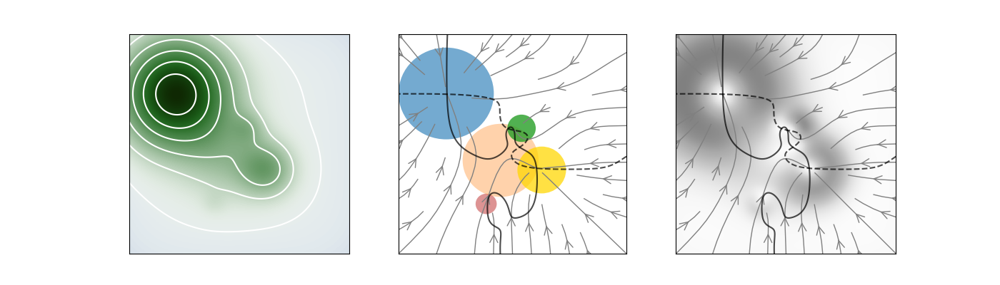

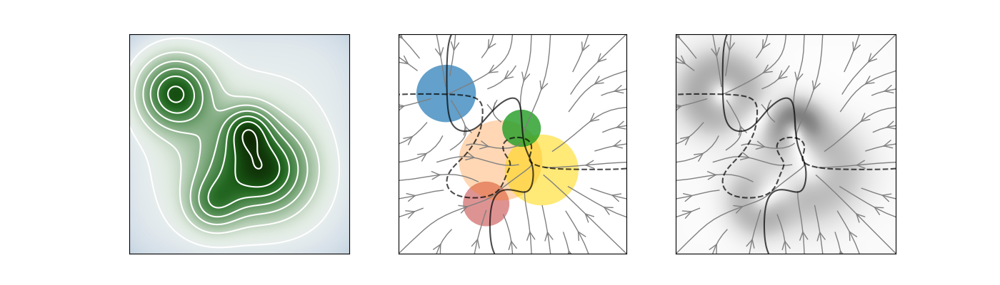

Cluster 1


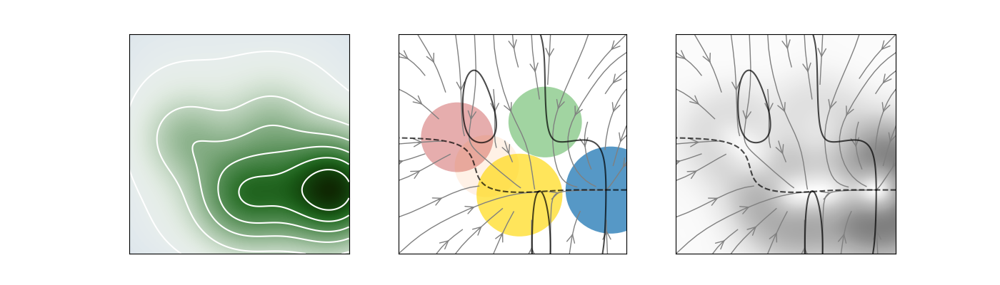

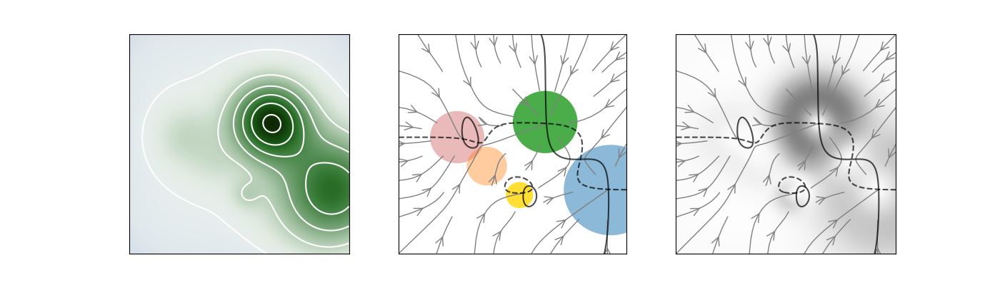

Cluster 2


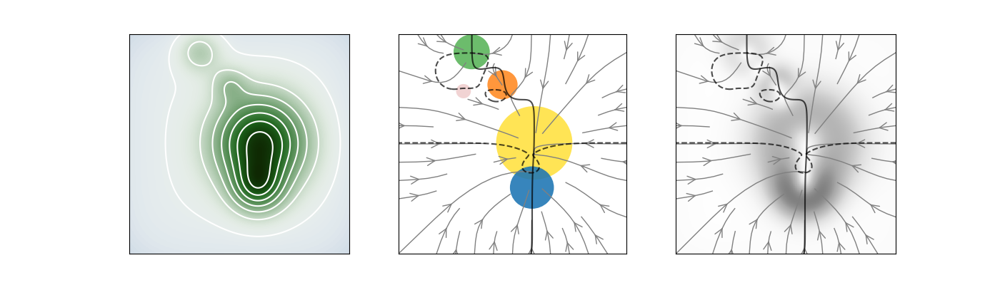

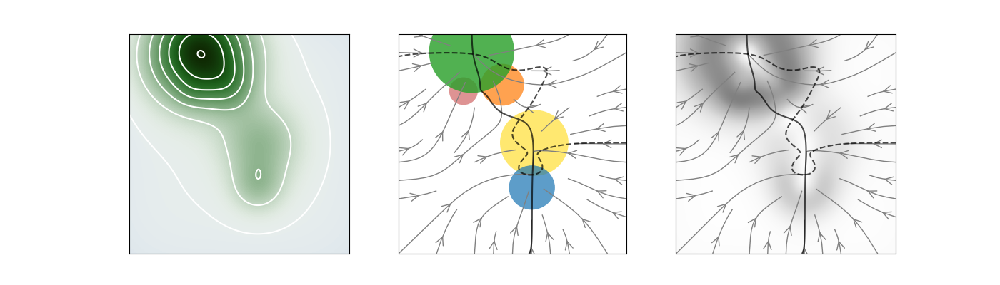

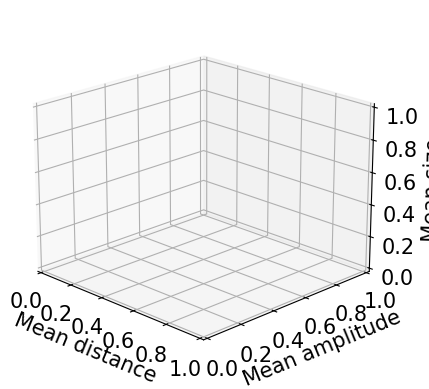

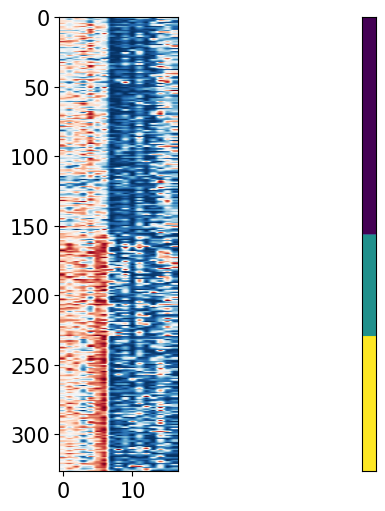

4 components
Score: 9.031349028528492
0 fitness: -0.19462894776152986 0.04296789904700447
1 fitness: -0.21941235293088032 0.04299576496449975
2 fitness: -0.19513816361673617 0.04859683458664288
3 fitness: -0.24166434574365359 0.04349808519369506
Cluster 0


/Users/victoria/Library/Caches/pypoetry/virtualenvs/landscapes-O0yv0U85-py3.11/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/victoria/Library/Caches/pypoetry/virtualenvs/landscapes-O0yv0U85-py3.11/lib/python3.11/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


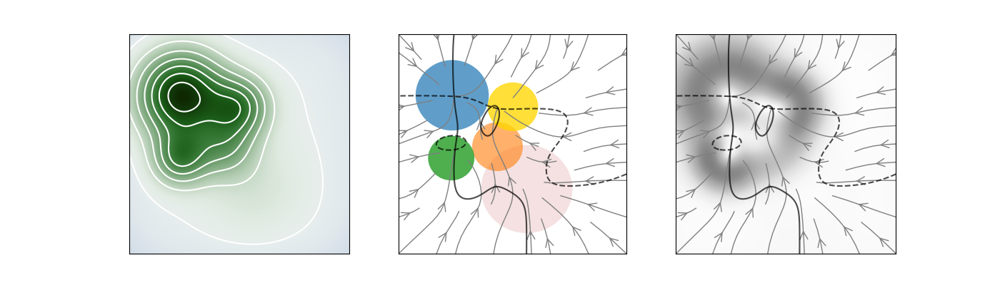

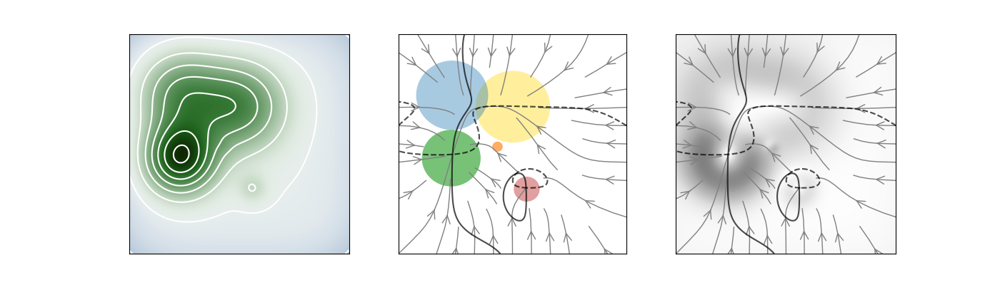

Cluster 1


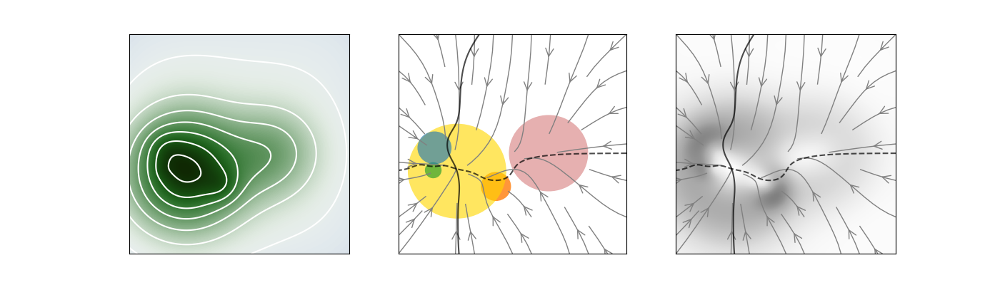

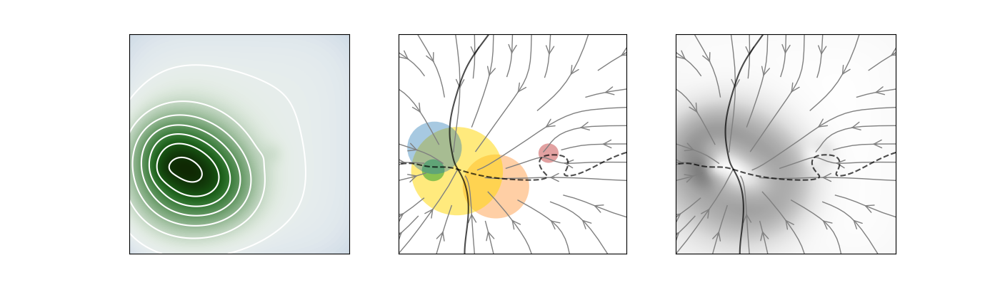

Cluster 2


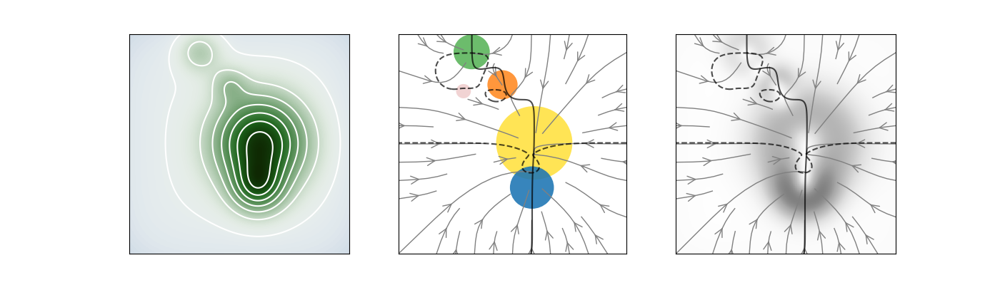

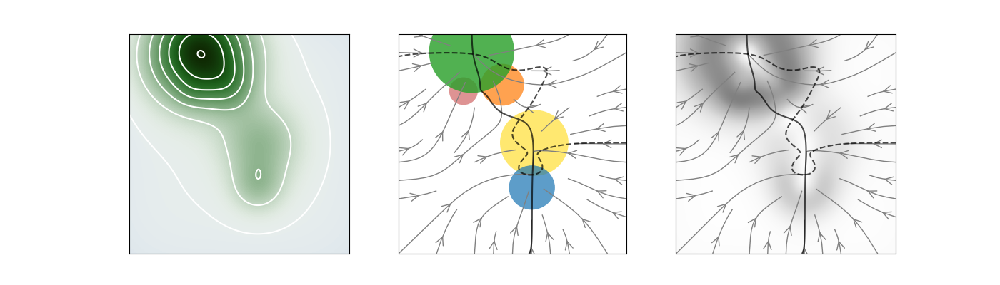

Cluster 3


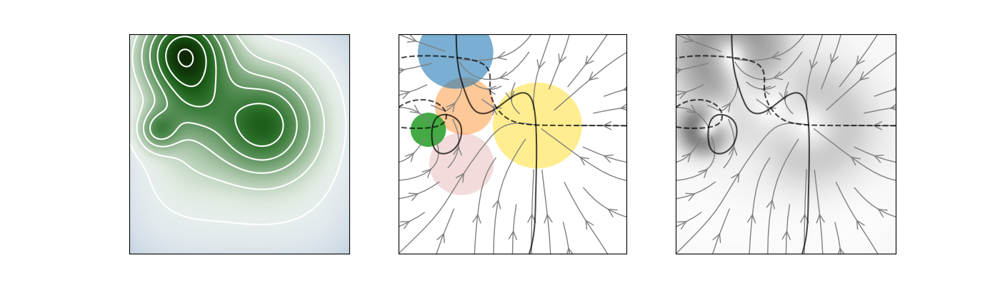

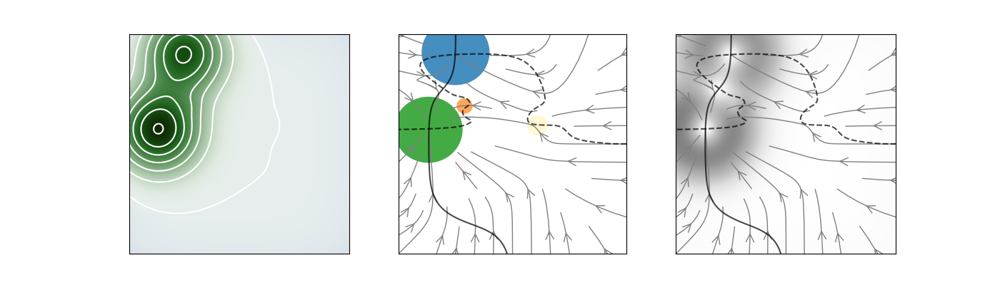

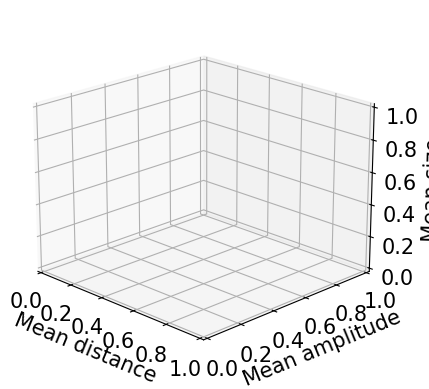

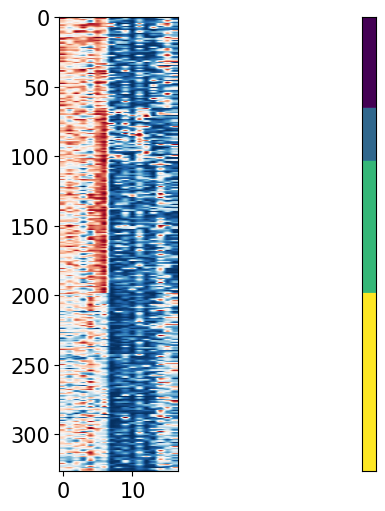

5 components
Score: 9.24443459356162
0 fitness: -0.20802612557849634 0.04750824318176613
1 fitness: -0.20064649285438607 0.04989944812859112
2 fitness: -0.19520106172942803 0.05077931873523618
3 fitness: -0.2490312587035759 0.03665470705433291
4 fitness: -0.2177377845753756 0.04366828207536606
Cluster 0


/Users/victoria/Library/Caches/pypoetry/virtualenvs/landscapes-O0yv0U85-py3.11/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/victoria/Library/Caches/pypoetry/virtualenvs/landscapes-O0yv0U85-py3.11/lib/python3.11/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


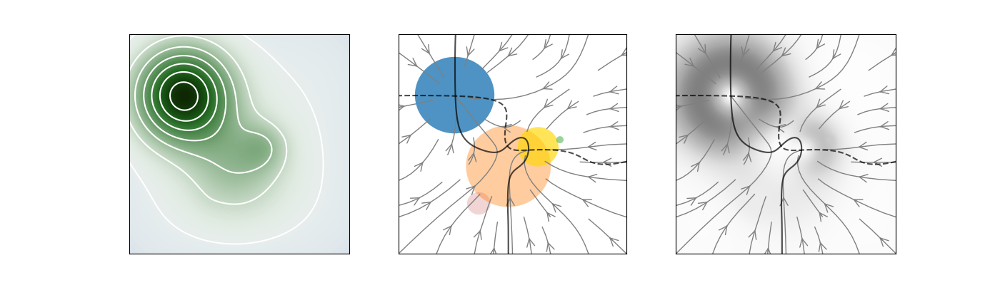

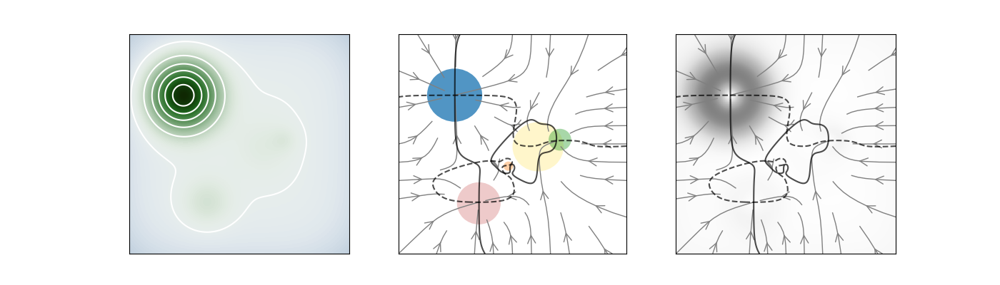

Cluster 1


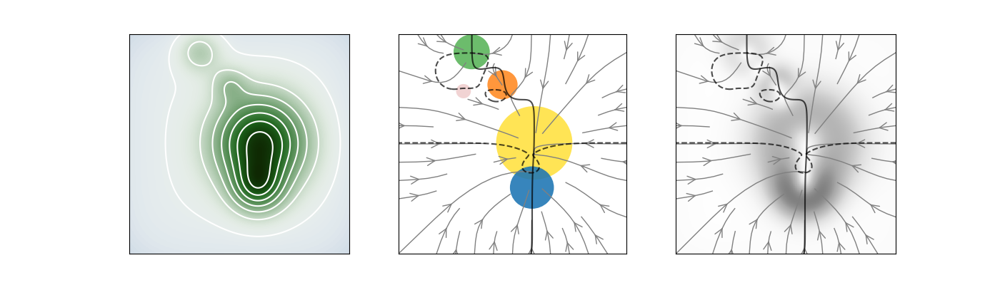

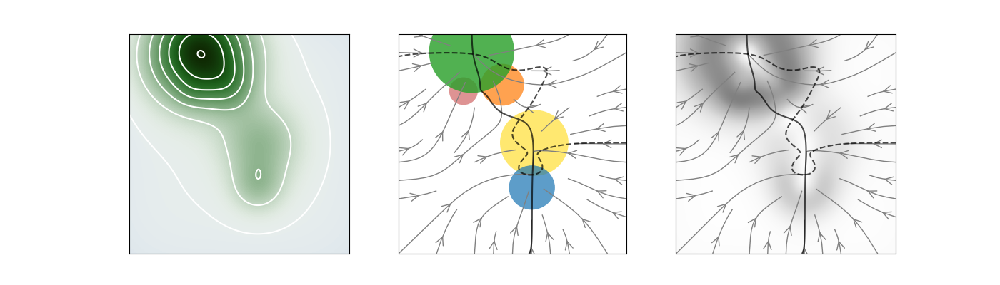

Cluster 2


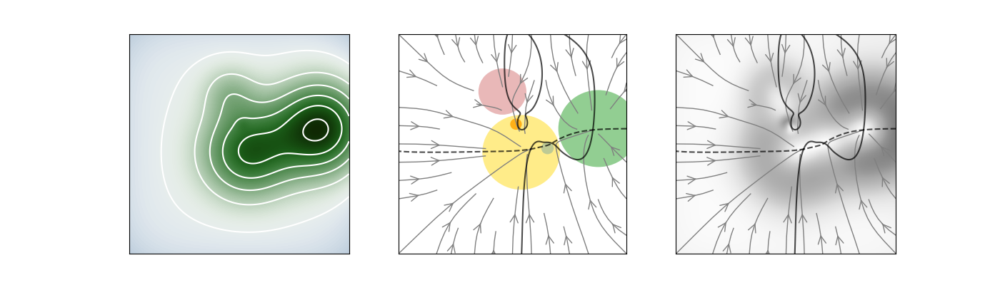

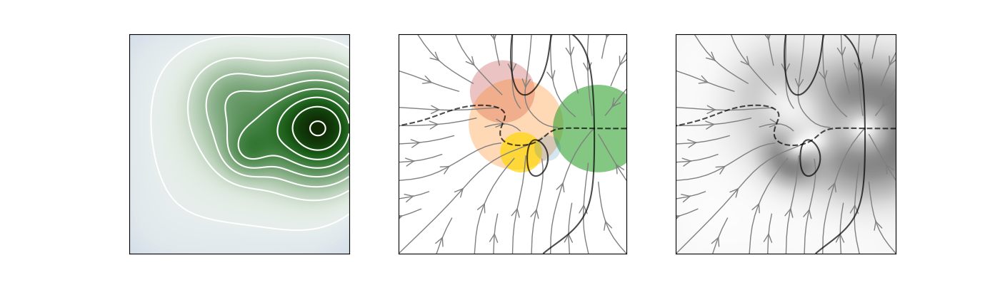

Cluster 3


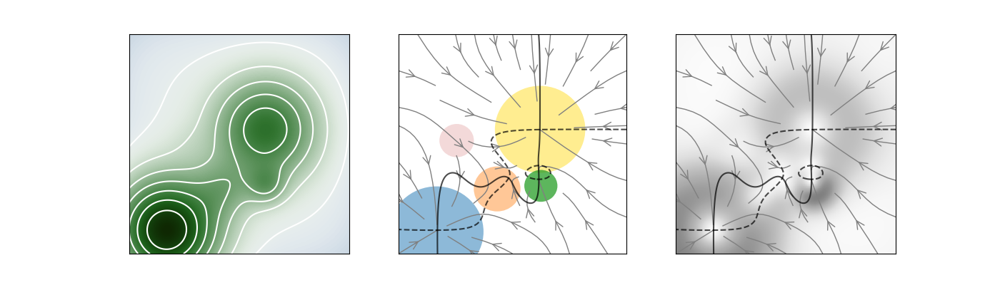

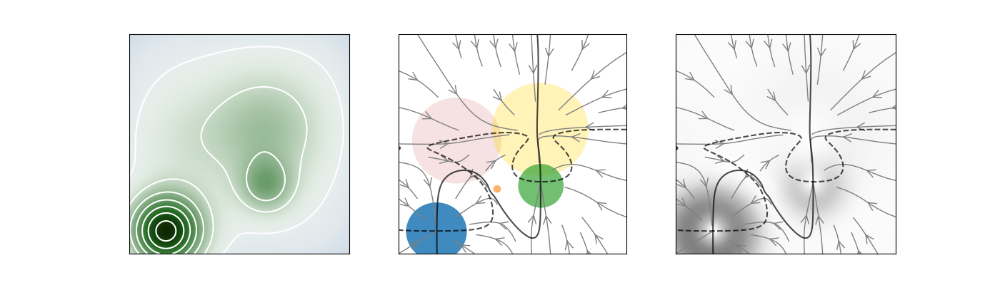

Cluster 4


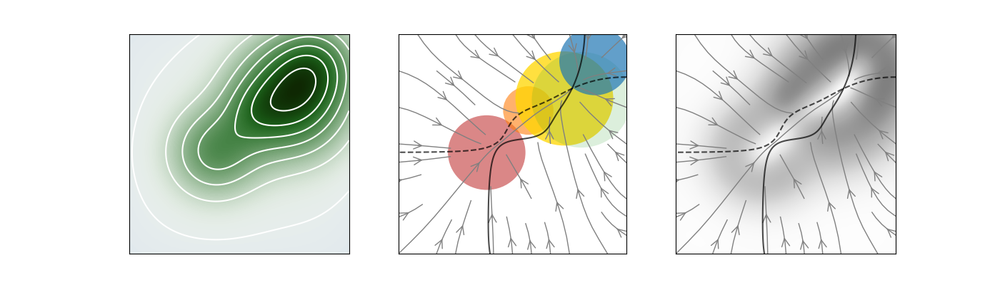

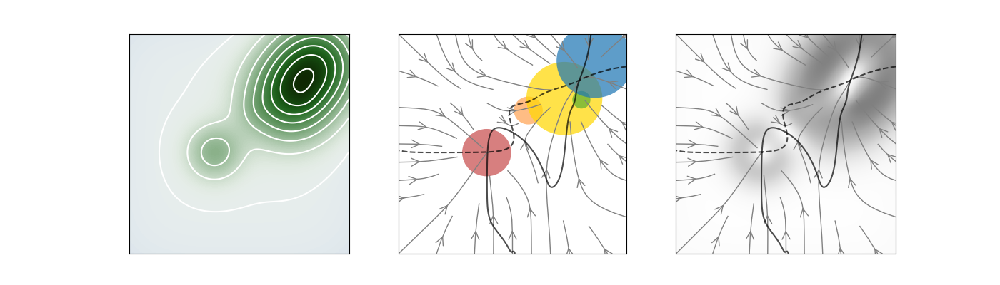

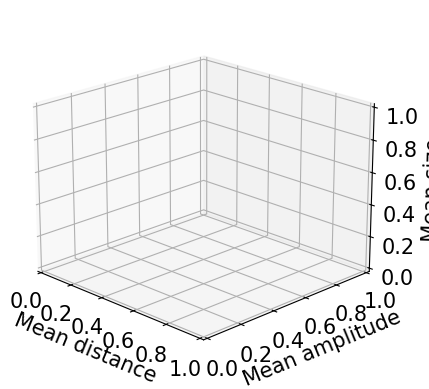

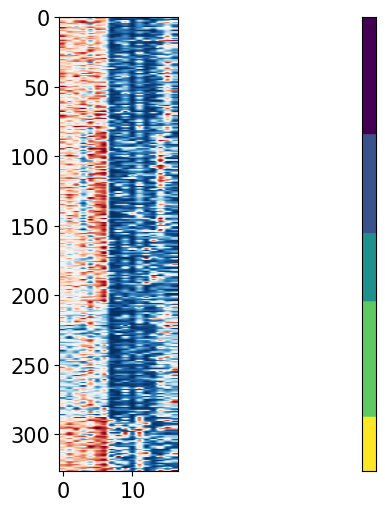

6 components
Score: 9.850410162783374
0 fitness: -0.20045748219991802 0.04841678155176757
1 fitness: -0.20747274464445936 0.05111417303786892
2 fitness: -0.2001890167220598 0.04176357266415583
3 fitness: -0.2483730607378227 0.03618122605648696
4 fitness: -0.22298926996692314 0.040183457708177606
5 fitness: -0.19464829199462694 0.05269420646444595
Cluster 0


/Users/victoria/Library/Caches/pypoetry/virtualenvs/landscapes-O0yv0U85-py3.11/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/victoria/Library/Caches/pypoetry/virtualenvs/landscapes-O0yv0U85-py3.11/lib/python3.11/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


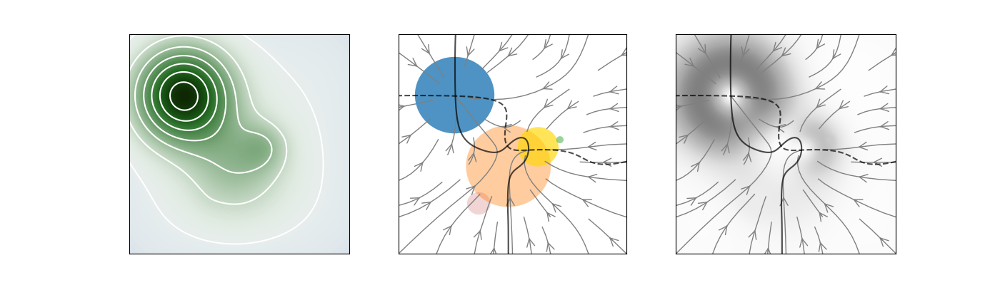

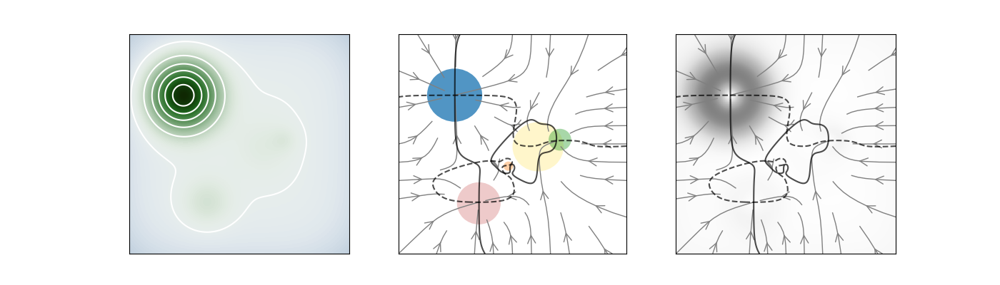

Cluster 1


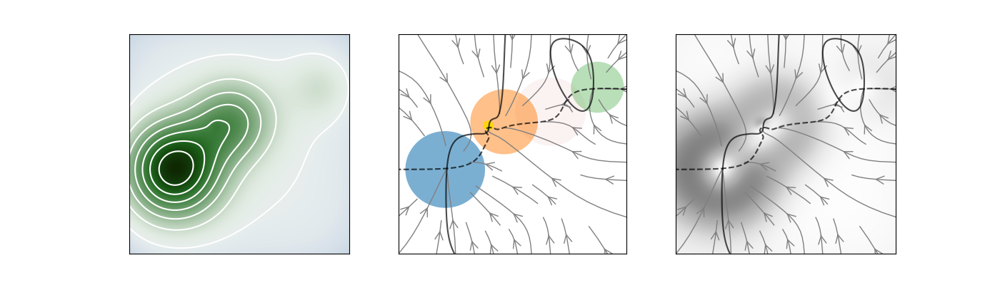

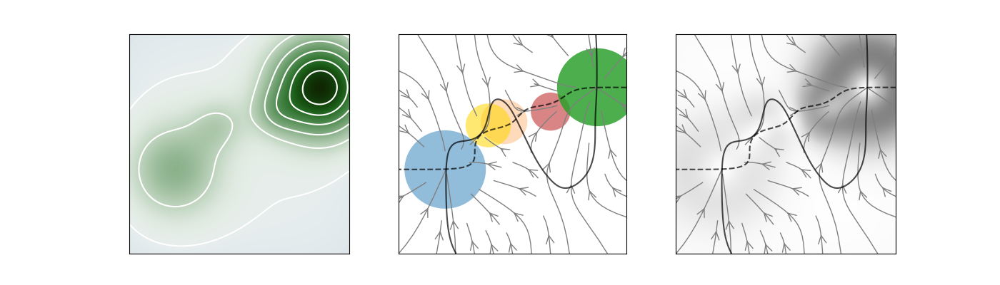

Cluster 2


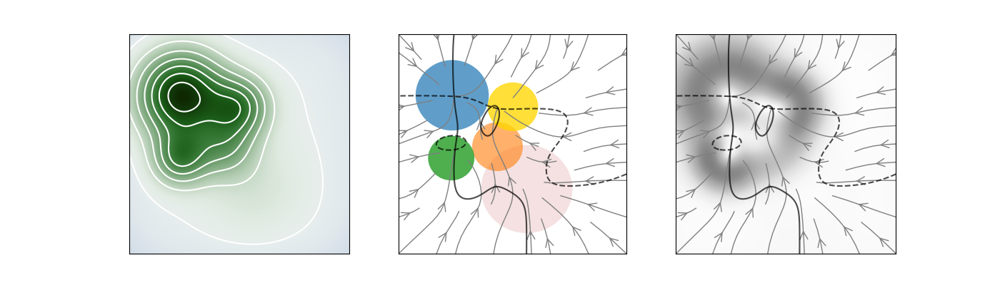

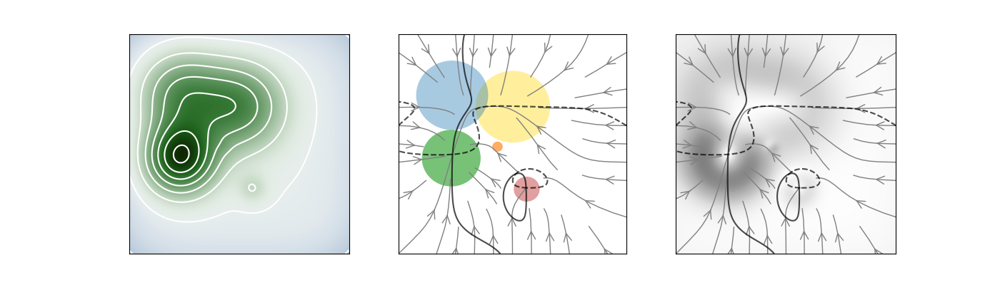

Cluster 3


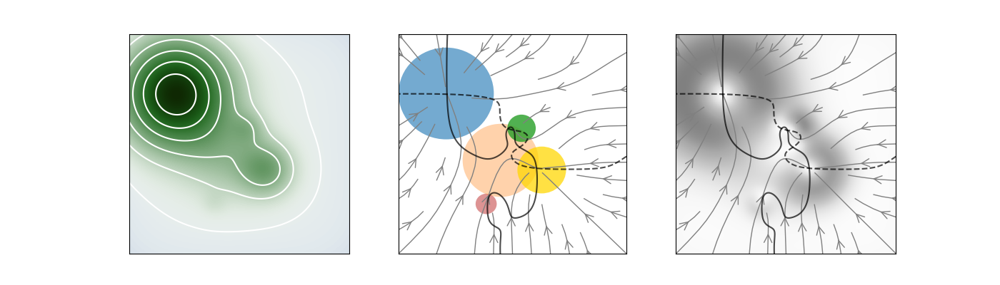

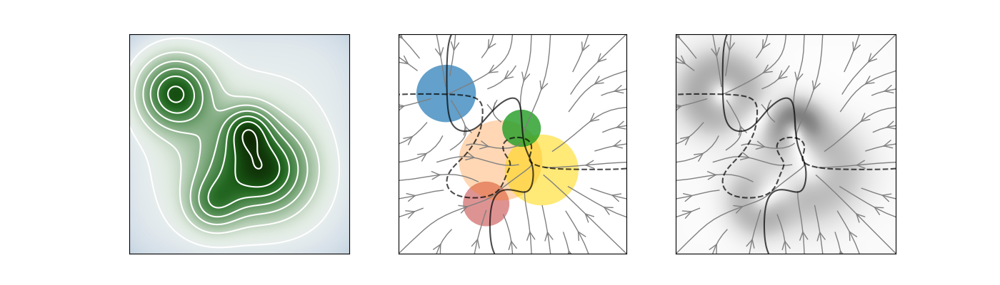

Cluster 4


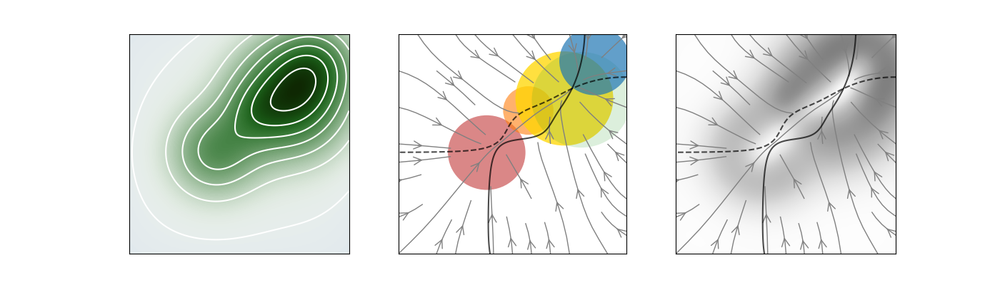

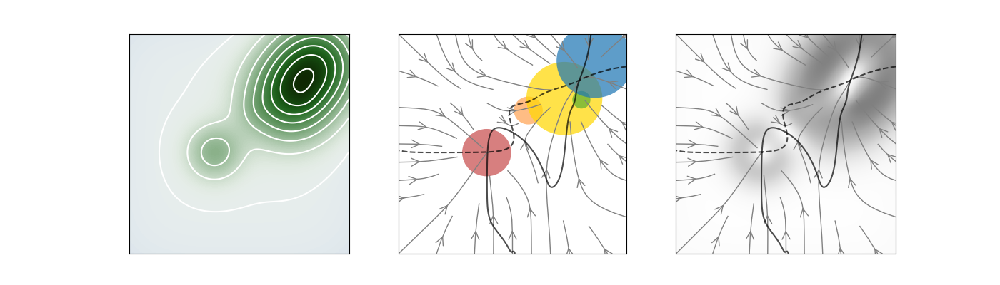

Cluster 5


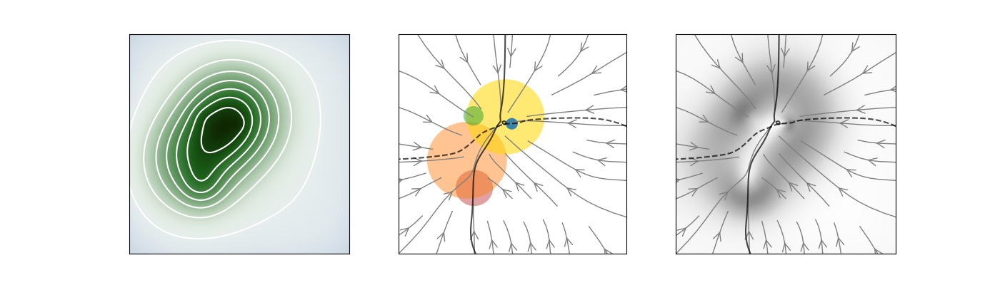

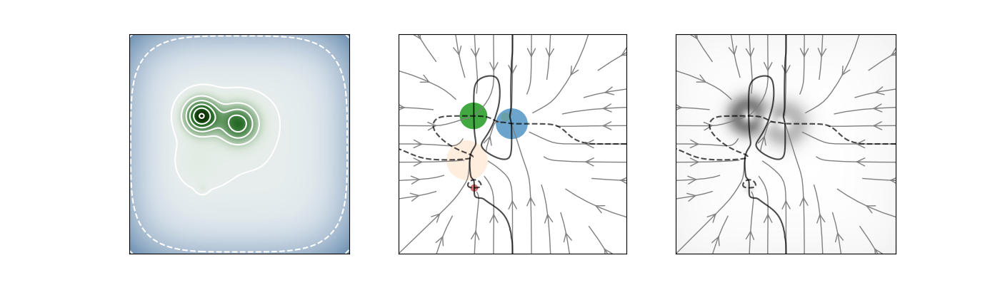

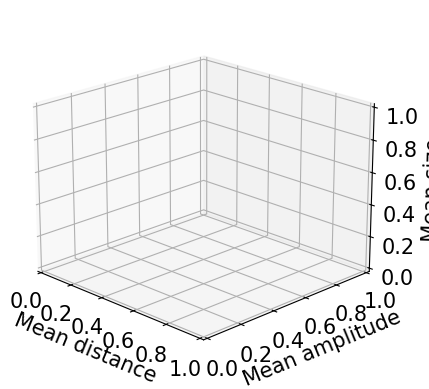

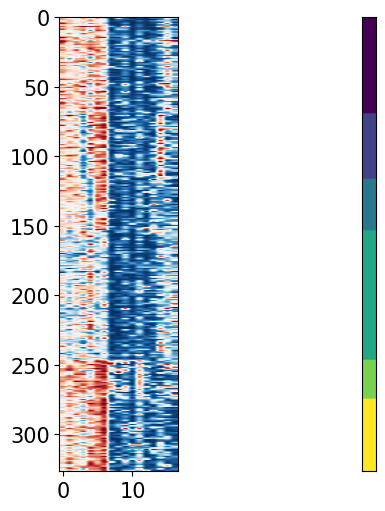

In [56]:
from sklearn.mixture import GaussianMixture
X  = all_pars
for n_components in (2,3,4,5,6):
    print(n_components, 'components')
    gm = GaussianMixture(n_components=n_components, random_state=0, covariance_type='full').fit(X)

    labels = gm.fit_predict(X)
    
    print('Score:', gm.score(X))
    
    for label in np.unique(labels):
        label_fitness = all_fitness[labels == label]
        print(label, 'fitness:', np.mean(label_fitness), np.std(label_fitness))
        
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d", azim=-45, elev=20)
    # ax.scatter(X[:, 1], X[:, 3], X[:, 9], c=labels.astype(float), edgecolor=None)
    # ax.set_xlabel(par_names[1])
    # ax.set_ylabel(par_names[3])
    # ax.set_zlabel(par_names[9])
    avg_dist = np.mean(X[:, :10], axis=1)
    avg_a = np.mean(X[:, 10:20], axis=1)
    avg_s = np.mean(X[:, 20:], axis=1)
    # ax.scatter(X[:, 1], X[:, 3], X[:, 9], c=labels.astype(float), edgecolor="k")
    ax.scatter(avg_dist, avg_a, avg_s, c=labels.astype(float), edgecolor=None)
    ax.set_xlabel('Mean distance')
    ax.set_ylabel('Mean amplitude')
    ax.set_zlabel('Mean size')
    
    #  #  plot the landscapes closest to the center and the cluster mean _______________
    # Xc = np.zeros((n_components, 3))
    for k in range(n_components):
        Xk = X[labels==k, :]
        timecodes_k = timecodes[labels==k]
        ind = np.argmin(np.linalg.norm(Xk - gm.means_[k], 2, axis=1))
        timecode = timecodes_k.iloc[ind]
        print('Cluster', k)
        figure_from_timecode(timecode, 'landscape_1')
        figure_from_timecode(timecode, 'landscape_2')
        

        # Xc[k] = Xk[ind, 1], Xk[ind, 3], Xk[ind, 9]
        # landscape=landscape_from_timecode(timecode, data_dir, 299, landscape_pars)
        # print(landscape)
    # ax.scatter(Xc[:, 0], Xc[:, 1], Xc[:, 2], c=range(n_components), marker = 'o', s=100, alpha=1)
    # means = gm.means_
    # ax.scatter(means[:, 1], means[:, 3], means[:, 9], c=range(n_components), marker = '*', s=150, alpha=1)
    
    # plt.legend()
    plt.show()

    fig, ax = plt.subplots(1,2, figsize=(5,5), width_ratios=(9,1), constrained_layout=True)
    ax[0].imshow(X[np.argsort(labels), :], interpolation=None, cmap='RdBu_r', aspect=0.2)
    ax[1].imshow(np.tile( np.sort(labels), (10,1)).T)
    ax[1].set_yticks([])
    ax[1].set_xticks([])
    
    plt.show()
    

    # scores = gm.score_samples(X[np.argsort(labels), :])
    # plt.plot(scores)
    # plt.show()
    # for k in range(n_components):
    #     dist = np.linalg.norm(X[np.argsort(labels)] - gm.means_[k], 2, axis=1)   
    #     plt.plot(dist)
    #     plt.ylim((0,10))
    # plt.show()
    # plt.legend()

    # print(np.round(gm.means_, 2))




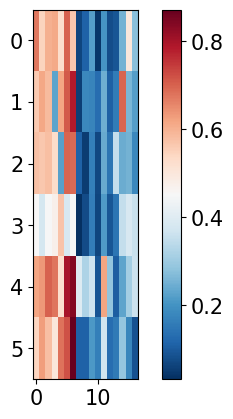

In [57]:
plt.imshow(gm.means_, cmap='RdBu_r', aspect=10)
plt.colorbar()

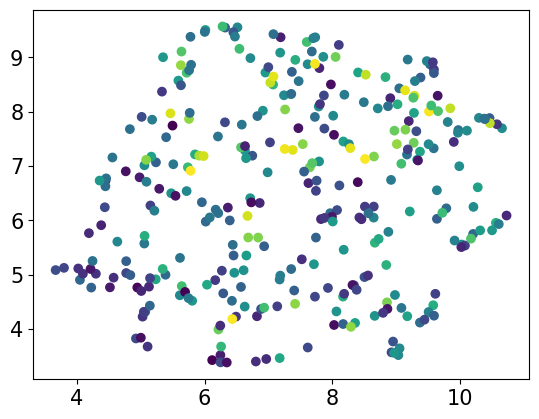

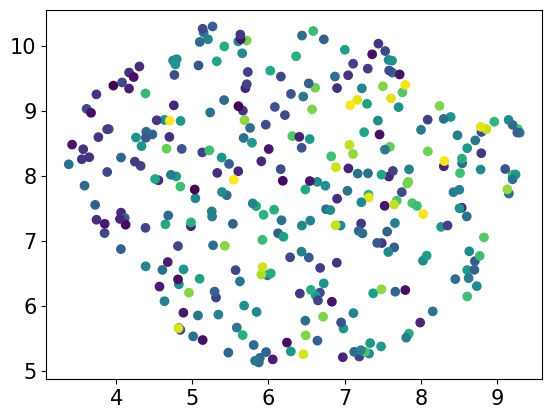

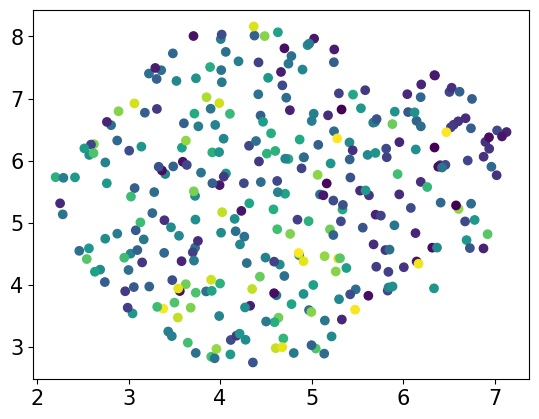

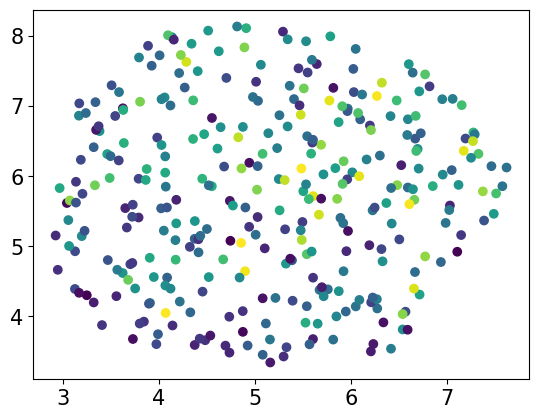

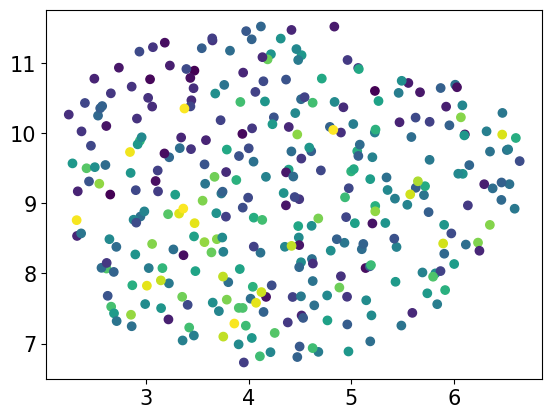

In [43]:
import umap


for n_neighbors in (5, 10, 20, 30, 50):
    
    reducer = umap.UMAP(n_neighbors=n_neighbors, metric='euclidean')
    
    embedding = reducer.fit_transform(all_pars)
    
    plt.scatter(embedding[:, 0], embedding[:, 1], c = all_fitness)
    plt.show()